# Phishing Website Detection Using Machine Learning Techniques


The dataset for this research work was downloaded from UCI Machine Learning Repository (https://archive.ics.uci.edu/dataset/327/phishing+websites) an online platform with massive ML datasets freely available. This dataset collected mainly from: PhishTank archive, MillerSmiles archive, Googleâ€™s searching operators. There 11055 rows and 31 columns.

In [1]:
#Schedule of Project
#Work through normal model
# - imbalance
# -Optimise model
# - interpret model (DT/RF feature importnant / SHAP / LIME)

# Import Necessary Libraries && Load Data

In [2]:
import warnings

In [3]:
#Install SHAP and LIME library
!pip install shap lime imbalanced-learn


     ---------------------------------------- 0.0/453.1 kB ? eta -:--:--
     -------------------------------- ----- 389.1/453.1 kB 8.1 MB/s eta 0:00:01
     -------------------------------------- 453.1/453.1 kB 7.1 MB/s eta 0:00:00
     ---------------------------------------- 0.0/275.7 kB ? eta -:--:--
     -------------------------------------- 275.7/275.7 kB 8.6 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ---------------------------------------- 0.0/258.0 kB ? eta -:--:--
     ------------------------------------- 258.0/258.0 kB 15.5 MB/s eta 0:00:00
     ---------------------------------------- 0.0/2.7 MB ? eta -:--:--
     ------------- -------------------------- 0.9/2.7 MB 18.3 MB/s eta 0:00:01
     ------------------------------ --------- 2.0/2.7 MB 21.6 MB/s eta 0:00:01
     ---------------------------------------- 2.7/2.7 MB 21.3 MB/s eta 0:00:00
     ---------------------------------------- 0.0/2


[notice] A new release of pip is available: 23.1.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
#Importing the libraries (tools) to be used

warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
import shap
from lime.lime_tabular import LimeTabularExplainer
%matplotlib inline
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.facecolor'] = '#00000000'
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, accuracy_score,precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score,roc_curve,plot_roc_curve
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV

In [5]:
#fish_path ='/content/drive/MyDrive/rt_iot_data/phishing_data_2.csv'
fish_path ='phishing_data_2.csv'

# Data Structure && Statistical Analysis

In [6]:
fish_data = pd.read_csv(fish_path)
fish_data.head(10)

,having_IP_Address,URL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,Favicon,...,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report,Result,Result_meaning
0,-1,1,1,1,-1,-1,-1,-1,-1,1,...,1,-1,-1,-1,-1,1,1,-1,-1,Phishy
1,1,1,1,1,1,-1,0,1,-1,1,...,1,-1,-1,0,-1,1,1,1,-1,Phishy
2,1,0,1,1,1,-1,-1,-1,-1,1,...,1,1,-1,1,-1,1,0,-1,-1,Phishy
3,1,0,1,1,1,-1,-1,-1,1,1,...,1,-1,-1,1,-1,1,-1,1,-1,Phishy
4,1,0,-1,1,1,-1,1,1,-1,1,...,1,-1,-1,0,-1,1,1,1,1,Legitimate
5,-1,0,-1,1,-1,-1,1,1,-1,1,...,1,1,1,1,-1,1,-1,-1,1,Legitimate
6,1,0,-1,1,1,-1,-1,-1,1,1,...,1,1,-1,-1,-1,1,0,-1,-1,Phishy
7,1,0,1,1,1,-1,-1,-1,1,1,...,1,-1,-1,0,-1,1,0,1,-1,Phishy
8,1,0,-1,1,1,-1,1,1,-1,1,...,1,1,-1,1,1,1,0,1,1,Legitimate
9,1,1,-1,1,1,-1,-1,1,-1,1,...,1,1,-1,0,-1,1,0,1,-1,Phishy


In [7]:
#(Displaying the last 10 rows of the data set)
fish_data.tail()

,having_IP_Address,URL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,Favicon,...,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report,Result,Result_meaning
11050,1,-1,1,-1,1,1,1,1,-1,-1,...,-1,1,1,-1,-1,1,1,1,1,Legitimate
11051,-1,1,1,-1,-1,-1,1,-1,-1,-1,...,1,1,1,1,1,1,-1,1,-1,Phishy
11052,1,-1,1,1,1,-1,1,-1,-1,1,...,1,1,1,1,-1,1,0,1,-1,Phishy
11053,-1,-1,1,1,1,-1,-1,-1,1,-1,...,1,1,1,1,-1,1,1,1,-1,Phishy
11054,-1,-1,1,1,1,-1,-1,-1,1,1,...,1,-1,1,-1,-1,-1,1,-1,-1,Phishy


In [8]:
# Checking the size of the data
fish_data.shape

(11055, 32)

In [9]:
#Basic statistics of the data
fish_data.describe()

,having_IP_Address,URL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registeration_length,Favicon,...,popUpWidnow,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report,Result
count,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,...,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000,11055.000000
mean,0.313795,-0.633198,0.738761,0.700588,0.741474,-0.734962,0.063953,0.250927,-0.336771,0.628584,...,0.613388,0.816915,0.061239,0.377114,0.287291,-0.483673,0.721574,0.344007,0.719584,0.113885
std,0.949534,0.766095,0.673998,0.713598,0.671011,0.678139,0.817518,0.911892,0.941629,0.777777,...,0.789818,0.576784,0.998168,0.926209,0.827733,0.875289,0.692369,0.569944,0.694437,0.993539
min,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,-1.000000,-1.000000,1.000000,1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000,...,1.000000,1.000000,-1.000000,-1.000000,0.000000,-1.000000,1.000000,0.000000,1.000000,-1.000000
50%,1.000000,-1.000000,1.000000,1.000000,1.000000,-1.000000,0.000000,1.000000,-1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,-1.000000,1.000000,0.000000,1.000000,1.000000
75%,1.000000,-1.000000,1.000000,1.000000,1.000000,-1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [10]:
#Getting a quick summary of the data
fish_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11055 entries, 0 to 11054
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   having_IP_Address            11055 non-null  int64 
 1   URL_Length                   11055 non-null  int64 
 2   Shortining_Service           11055 non-null  int64 
 3   having_At_Symbol             11055 non-null  int64 
 4   double_slash_redirecting     11055 non-null  int64 
 5   Prefix_Suffix                11055 non-null  int64 
 6   having_Sub_Domain            11055 non-null  int64 
 7   SSLfinal_State               11055 non-null  int64 
 8   Domain_registeration_length  11055 non-null  int64 
 9   Favicon                      11055 non-null  int64 
 10  port                         11055 non-null  int64 
 11  HTTPS_token                  11055 non-null  int64 
 12  Request_URL                  11055 non-null  int64 
 13  URL_of_Anchor                11

In [11]:
#Rename mispelled columns
fish_data.rename(columns={"Domain_registeration_length": "Domain_registration_length", "popUpWidnow":"popUpWindow"}, inplace=True)

fish_data

,having_IP_Address,URL_Length,Shortining_Service,having_At_Symbol,double_slash_redirecting,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registration_length,Favicon,...,Iframe,age_of_domain,DNSRecord,web_traffic,Page_Rank,Google_Index,Links_pointing_to_page,Statistical_report,Result,Result_meaning
0,-1,1,1,1,-1,-1,-1,-1,-1,1,...,1,-1,-1,-1,-1,1,1,-1,-1,Phishy
1,1,1,1,1,1,-1,0,1,-1,1,...,1,-1,-1,0,-1,1,1,1,-1,Phishy
2,1,0,1,1,1,-1,-1,-1,-1,1,...,1,1,-1,1,-1,1,0,-1,-1,Phishy
3,1,0,1,1,1,-1,-1,-1,1,1,...,1,-1,-1,1,-1,1,-1,1,-1,Phishy
4,1,0,-1,1,1,-1,1,1,-1,1,...,1,-1,-1,0,-1,1,1,1,1,Legitimate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11050,1,-1,1,-1,1,1,1,1,-1,-1,...,-1,1,1,-1,-1,1,1,1,1,Legitimate
11051,-1,1,1,-1,-1,-1,1,-1,-1,-1,...,1,1,1,1,1,1,-1,1,-1,Phishy
11052,1,-1,1,1,1,-1,1,-1,-1,1,...,1,1,1,1,-1,1,0,1,-1,Phishy
11053,-1,-1,1,1,1,-1,-1,-1,1,-1,...,1,1,1,1,-1,1,1,1,-1,Phishy


# Exploratory Data Analysis

To help better understand the data distribution and the patterns or relationships between the independent and the target varibles value counts and some visualization are conducted on the data.

In [12]:
#Checking if we have any missing values
fish_data.isna().sum()

having_IP_Address             0
URL_Length                    0
Shortining_Service            0
having_At_Symbol              0
double_slash_redirecting      0
Prefix_Suffix                 0
having_Sub_Domain             0
SSLfinal_State                0
Domain_registration_length    0
Favicon                       0
port                          0
HTTPS_token                   0
Request_URL                   0
URL_of_Anchor                 0
Links_in_tags                 0
SFH                           0
Submitting_to_email           0
Abnormal_URL                  0
Redirect                      0
on_mouseover                  0
RightClick                    0
popUpWindow                   0
Iframe                        0
age_of_domain                 0
DNSRecord                     0
web_traffic                   0
Page_Rank                     0
Google_Index                  0
Links_pointing_to_page        0
Statistical_report            0
Result                        0
Result_m

In [13]:
#checking again on the number of missing values
fish_data.isna().sum().sum()

0

We can see that there are no missing values in the dataset

In [14]:
#Checking the value count for each class of the target variable
fish_data.Result.value_counts()

 1    6157
-1    4898
Name: Result, dtype: int64

In [15]:
#Percentage of each target class in the dataset
labels_count = fish_data.Result.value_counts()
print("Percentage of phishing websites: "+str(round(labels_count[-1]*100/11055,2)))
print("Percentage of legitimate websites: "+str(round(labels_count[1]*100/11055,2)))

Percentage of phishing websites: 44.31
Percentage of legitimate websites: 55.69


The data distribution seems to be slightly unbalanced but let's see if that will be a problem.


[Text(0, 0, '4898'), Text(0, 0, '6157')]

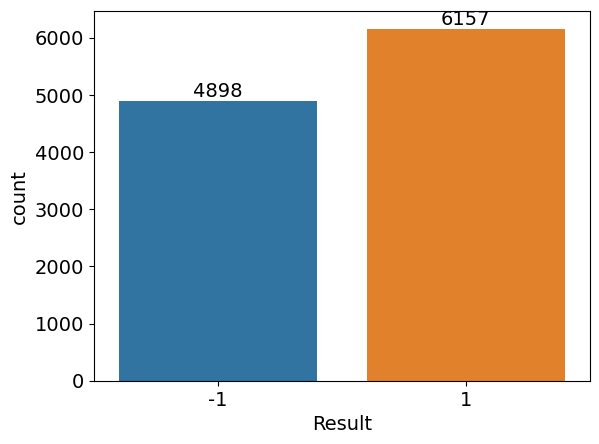

In [16]:
#Plot of the distribution of target classes
#target variable at glance
ax = sns.countplot(x='Result', data=fish_data)
ax.bar_label(ax.containers[0])
#.tight_layout()
#output_filename = "target_distrib_plot.png"
#plt.savefig(output_filename)


In [17]:
#Looking at the frequencies of -1, 0, 1 for each feature
df = fish_data
# Initialize a dictionary to store the frequency counts of each numeric value
numeric_value_counts = {}

# Iterate through each column in the DataFrame
for column in df.columns:
    if df[column].dtype == 'int64' or df[column].dtype == 'float64':  # Check if column is numeric
        # Count the frequency of each numeric value
        counts = df[column].value_counts().to_dict()

        # Update the numeric_value_counts dictionary with the counts
        numeric_value_counts[column] = counts

# Print the frequency counts of each encoded numeric value
for column, counts in numeric_value_counts.items():
    print(f"Column: {column}")
    for value, count in counts.items():
        print(f"Value: {value}, Frequency: {count}")
    print()

Column: having_IP_Address
Value: 1, Frequency: 7262
Value: -1, Frequency: 3793

Column: URL_Length
Value: -1, Frequency: 8960
Value: 1, Frequency: 1960
Value: 0, Frequency: 135

Column: Shortining_Service
Value: 1, Frequency: 9611
Value: -1, Frequency: 1444

Column: having_At_Symbol
Value: 1, Frequency: 9400
Value: -1, Frequency: 1655

Column: double_slash_redirecting
Value: 1, Frequency: 9626
Value: -1, Frequency: 1429

Column: Prefix_Suffix
Value: -1, Frequency: 9590
Value: 1, Frequency: 1465

Column: having_Sub_Domain
Value: 1, Frequency: 4070
Value: 0, Frequency: 3622
Value: -1, Frequency: 3363

Column: SSLfinal_State
Value: 1, Frequency: 6331
Value: -1, Frequency: 3557
Value: 0, Frequency: 1167

Column: Domain_registration_length
Value: -1, Frequency: 7389
Value: 1, Frequency: 3666

Column: Favicon
Value: 1, Frequency: 9002
Value: -1, Frequency: 2053

Column: port
Value: 1, Frequency: 9553
Value: -1, Frequency: 1502

Column: HTTPS_token
Value: 1, Frequency: 9259
Value: -1, Frequen

In [18]:
# Features I decided to investigate since the distributions were interesting
sample_columns = ["URL_Length", "having_At_Symbol", "Shortining_Service", "Page_Rank", "Google_Index", "Abnormal_URL", "SFH", "web_traffic", "age_of_domain", "Redirect", "Prefix_Suffix"]

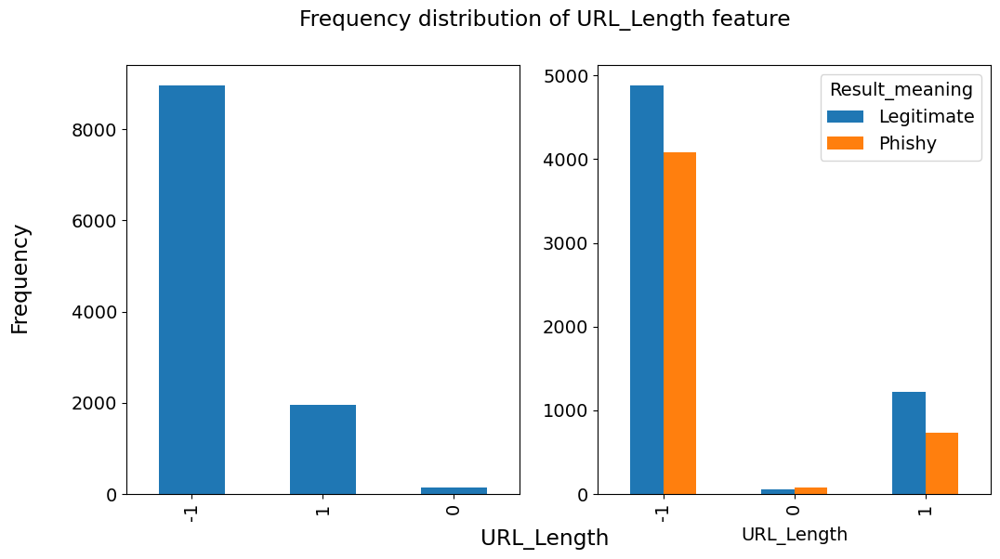

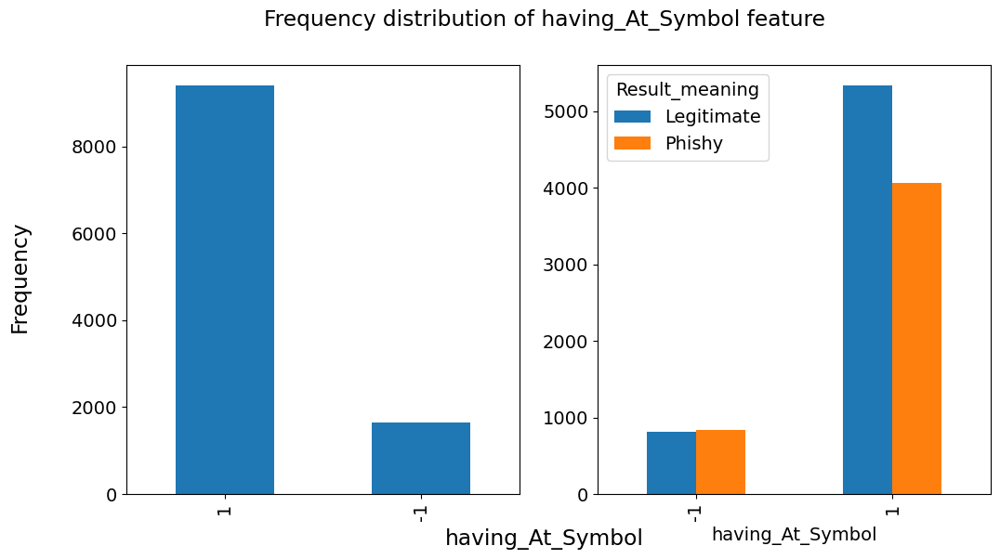

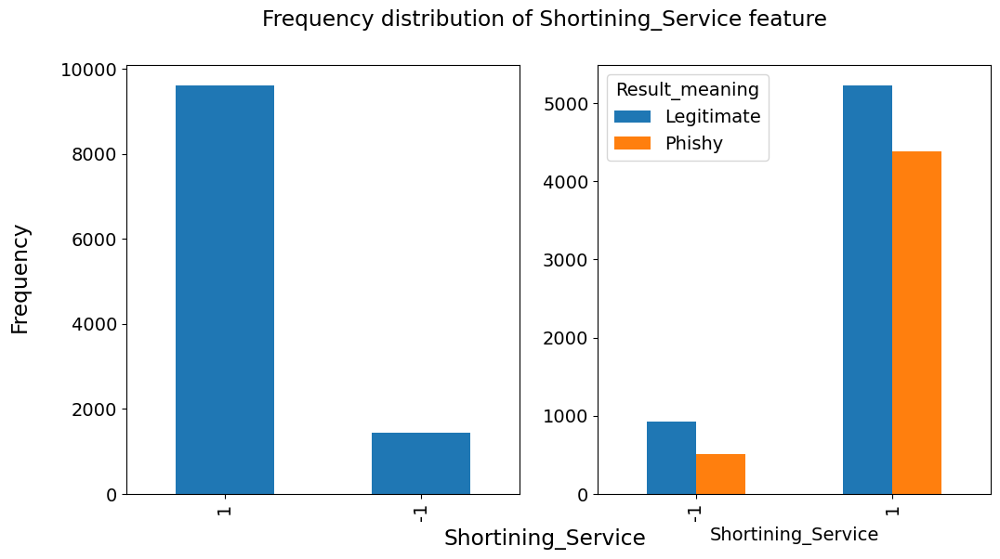

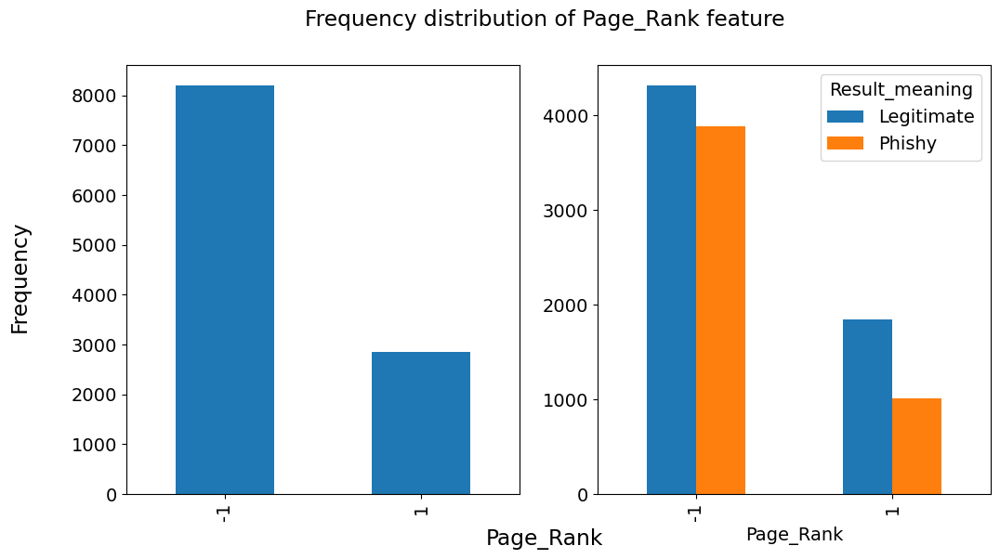

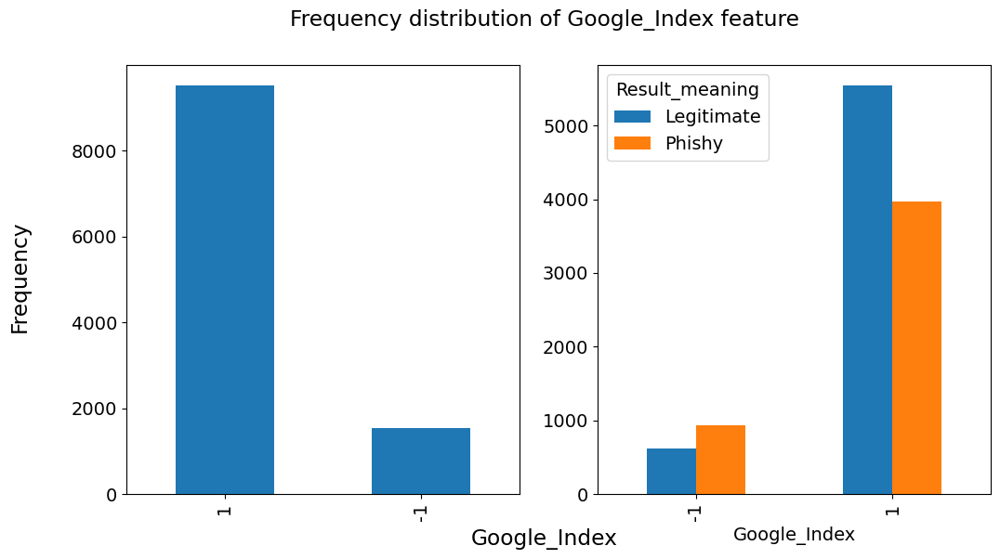

...

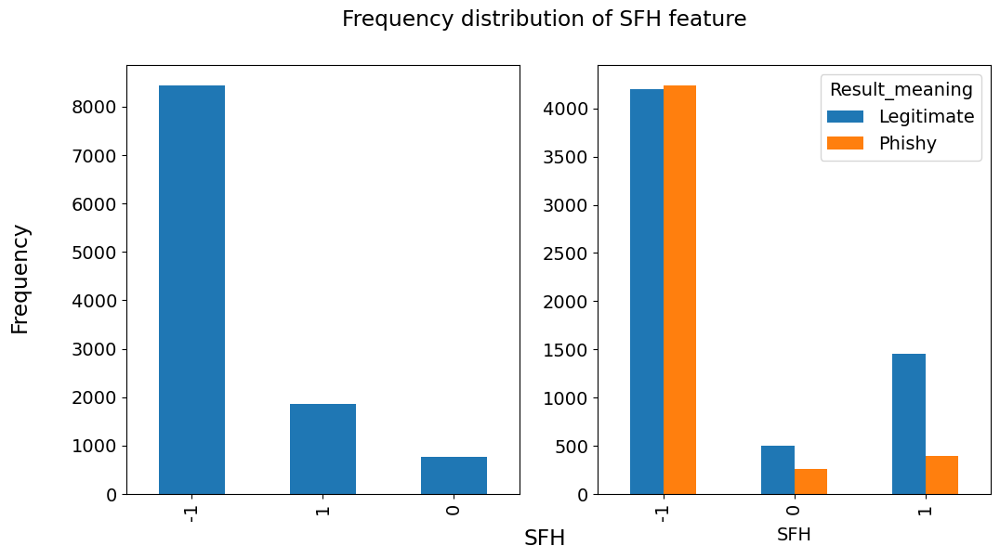

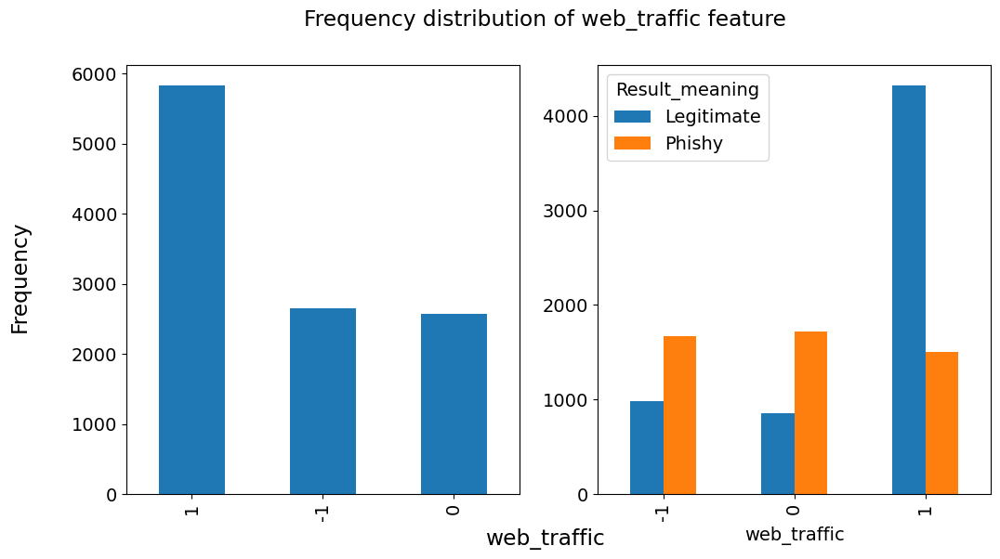

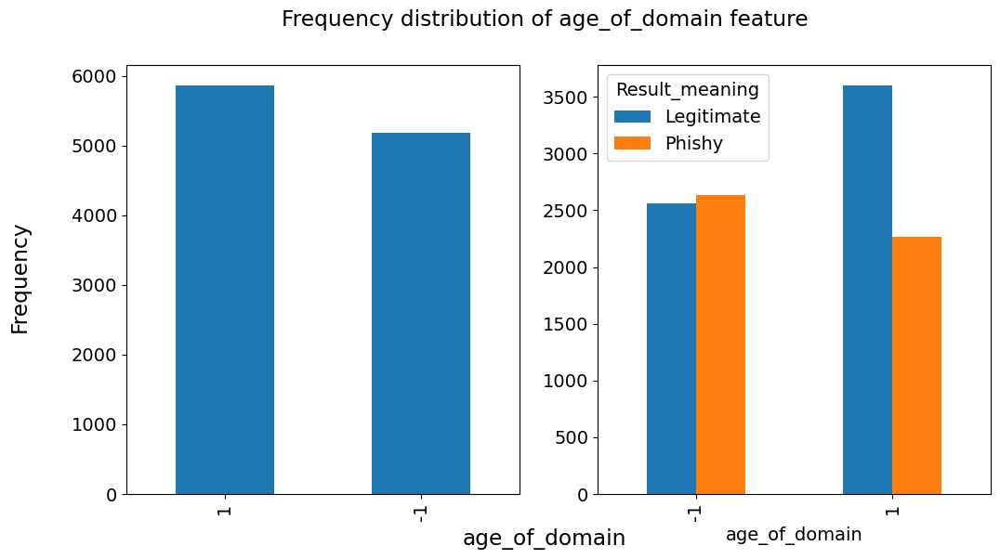

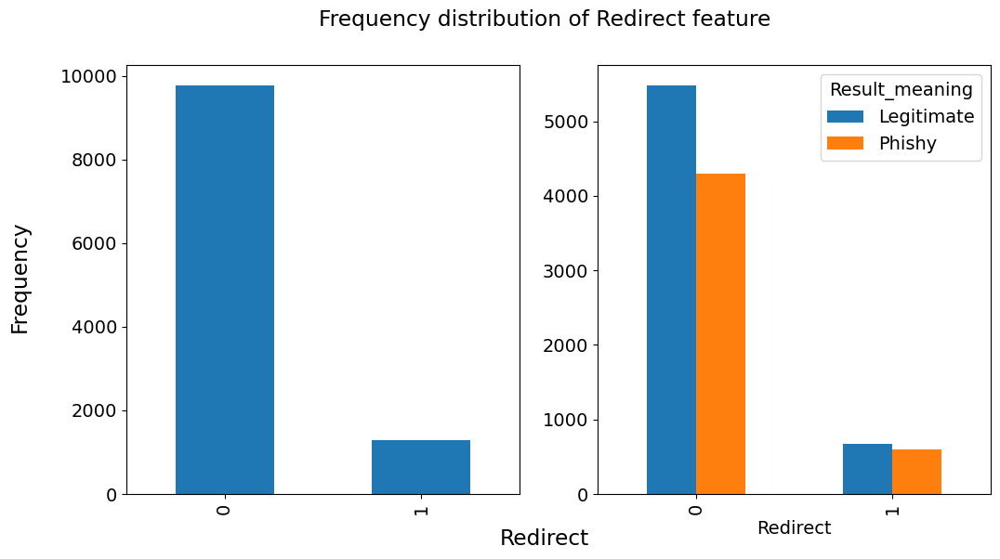

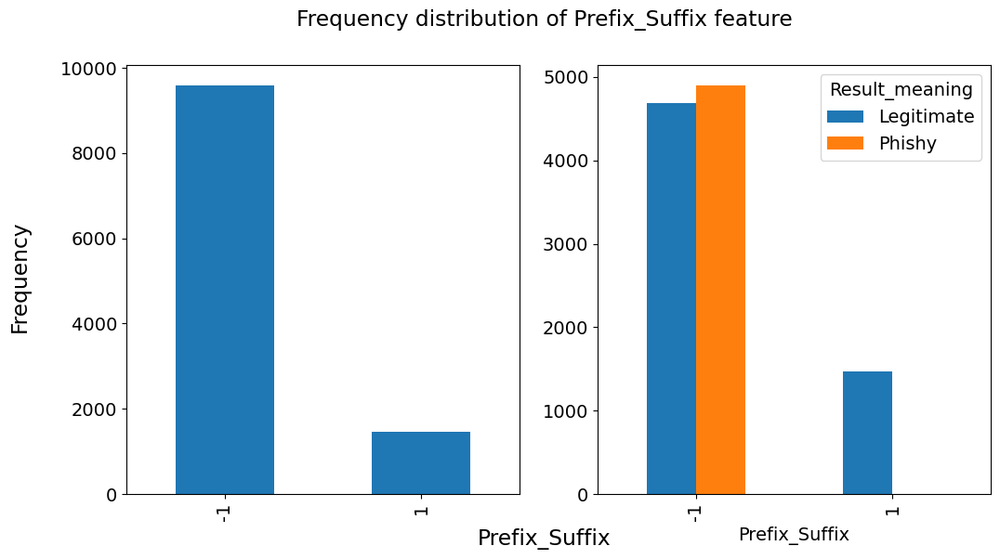

In [19]:
# Bar chart to understand the data better

# Iterate through each column in the DataFrame
for column in sample_columns:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    fish_data[column].value_counts().plot(kind='bar',ax=ax1)
    pd.crosstab(fish_data[column],fish_data.Result_meaning).plot(kind='bar' ,ax=ax2)
    fig.suptitle(f"Frequency distribution of {column} feature")
    fig.supxlabel(column)
    fig.supylabel('Frequency')
    plt.show()
    print('\n')


From the above distribution: 
a higher number (9000) of urls failed the URL_Length feature test but most of those websites were classified as Legitimate.

There were almost equal proportions of website that had @symbol in the url being classified as Legitimate and Phishing.

Most websites that used shortining service were legitimate as opposed to what the authors thought.

Most websites that were not google index are phishing websites.

A higher number of websites with abnormal url were legitimate.

Most websites with proper Server Form Handler were legitimate.

Websites without prefix or suffix were mostly legitimate.

In [20]:
y = fish_data.Result
X= fish_data.drop(["Result", "Result_meaning"], axis=1)

<Axes: >

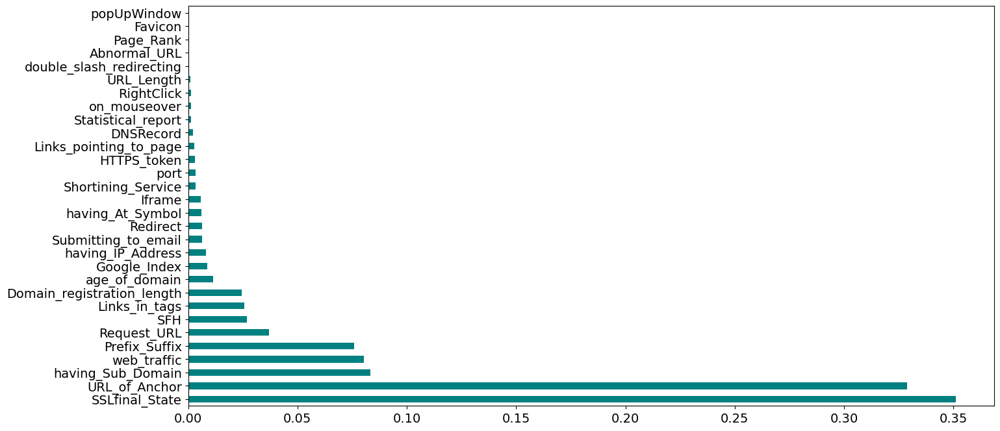

In [21]:
#A graph of how much information each feature contributes to the target variable| Using feature gain graph

score = mutual_info_classif(X, y, random_state=5)

feature_score = pd.Series(score, X.columns[0:len(X.columns)])
new_set = feature_score.sort_values(ascending=False)

plt.figure(figsize=(16,8))

new_set.plot(kind="barh", color="teal")

Text(0.5, 1.0, 'Correlation Heatmap')

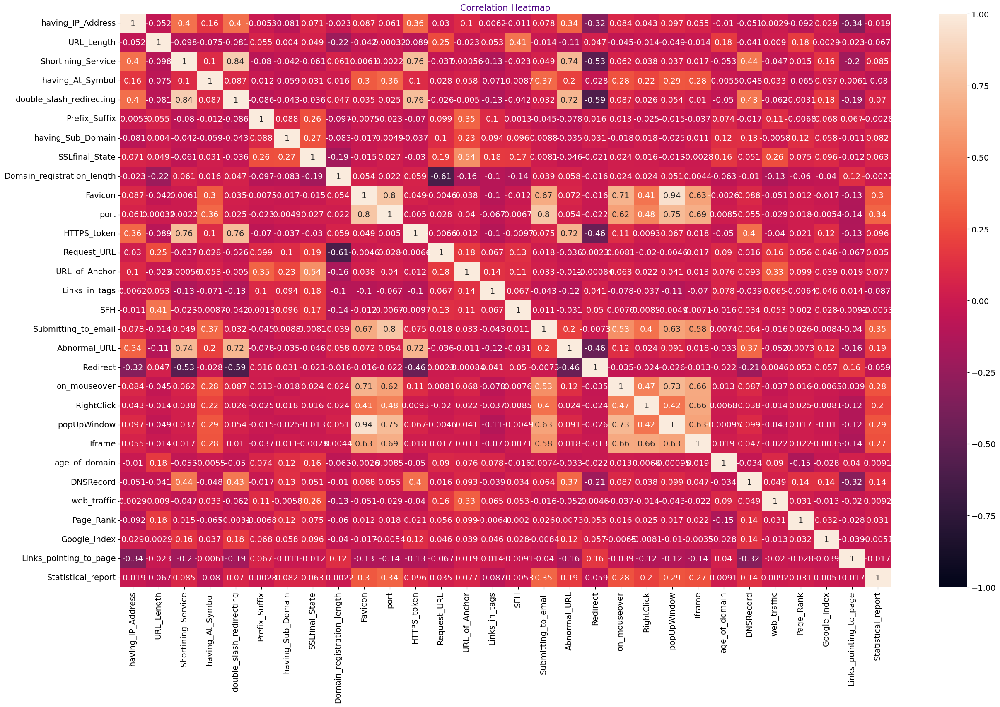

In [22]:
#Trying to understand the correlation of features

# Calculate the correlation between features
corr_ = X.corr()
plt.figure(figsize=(30,18))
heatmap = sns.heatmap(corr_, vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap',color='indigo', font='Verdana', fontsize=15)

In [23]:
#End of EDA

# Feature Selection

This helps us work with only fetures that are stistically relevant to our data set. We use Mutual Information Gain to select the top fetures relevant to our target variable.

In [24]:
#Use mutual information to select most useful features

# Set the threshold for mutual information
mutual_info_threshold = 0.008 


# Select features that meet the threshold
features_indices = np.where(score > mutual_info_threshold)[0]

# Get the names of the selected features
selected_features_names = X.columns[features_indices]

# Create a DataFrame containing only the selected features
final_features = X[selected_features_names]

# Print the selected features
print("Selected Features:")

print(final_features.head())

Selected Features:
   having_IP_Address  Prefix_Suffix  having_Sub_Domain  SSLfinal_State  \
0                 -1             -1                 -1              -1   
1                  1             -1                  0               1   
2                  1             -1                 -1              -1   
3                  1             -1                 -1              -1   
4                  1             -1                  1               1   

   Domain_registration_length  Request_URL  URL_of_Anchor  Links_in_tags  SFH  \
0                          -1            1             -1              1   -1   
1                          -1            1              0             -1   -1   
2                          -1            1              0             -1   -1   
3                           1           -1              0              0   -1   
4                          -1            1              0              0   -1   

   age_of_domain  web_traffic  Google_Index  
0  

In [25]:
#Check the no. of features selected
len(final_features.columns)

12

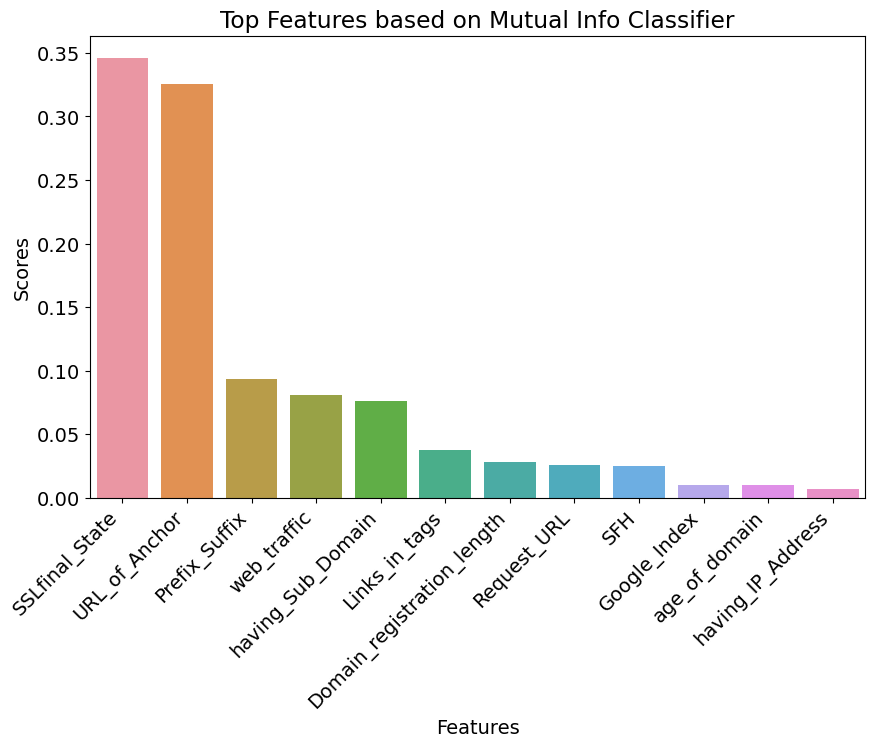

In [26]:
#Plot selected features based on their info score
m_score = mutual_info_classif(final_features, y, random_state=5)

feature_scores = pd.DataFrame({'Feature': final_features.columns[0:len(final_features.columns)], 'Score': m_score})
top_features = feature_scores.sort_values(by='Score', ascending=False)

# plot the top features selected
plt.figure(figsize=(10, 6))
sns.barplot(x='Feature', y='Score', data=top_features)
plt.title('Top Features based on Mutual Info Classifier')
plt.xlabel('Features')
plt.ylabel('Scores')
plt.xticks(rotation=45, ha='right')
plt.show()

In [27]:
#Best Features Selected and their Score 
top_features.reset_index(drop=True)


,Feature,Score
0,SSLfinal_State,0.346183
1,URL_of_Anchor,0.325298
2,Prefix_Suffix,0.093104
3,web_traffic,0.080754
4,having_Sub_Domain,0.075807
5,Links_in_tags,0.037762
6,Domain_registration_length,0.028147
7,Request_URL,0.026034
8,SFH,0.024859
9,Google_Index,0.010069


In [28]:
#Combining the data(I am adding the result column to the features dataset) so that I can use it for correlation check
final_data = pd.concat([final_features, y], axis=1)
final_data

,having_IP_Address,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registration_length,Request_URL,URL_of_Anchor,Links_in_tags,SFH,age_of_domain,web_traffic,Google_Index,Result
0,-1,-1,-1,-1,-1,1,-1,1,-1,-1,-1,1,-1
1,1,-1,0,1,-1,1,0,-1,-1,-1,0,1,-1
2,1,-1,-1,-1,-1,1,0,-1,-1,1,1,1,-1
3,1,-1,-1,-1,1,-1,0,0,-1,-1,1,1,-1
4,1,-1,1,1,-1,1,0,0,-1,-1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11050,1,1,1,1,-1,1,1,1,-1,1,-1,1,1
11051,-1,-1,1,-1,-1,1,-1,-1,0,1,1,1,-1
11052,1,-1,1,-1,-1,1,0,-1,-1,1,1,1,-1
11053,-1,-1,-1,-1,1,-1,-1,1,-1,1,1,1,-1


Text(0.5, 1.0, 'Feature Correlation With Target')

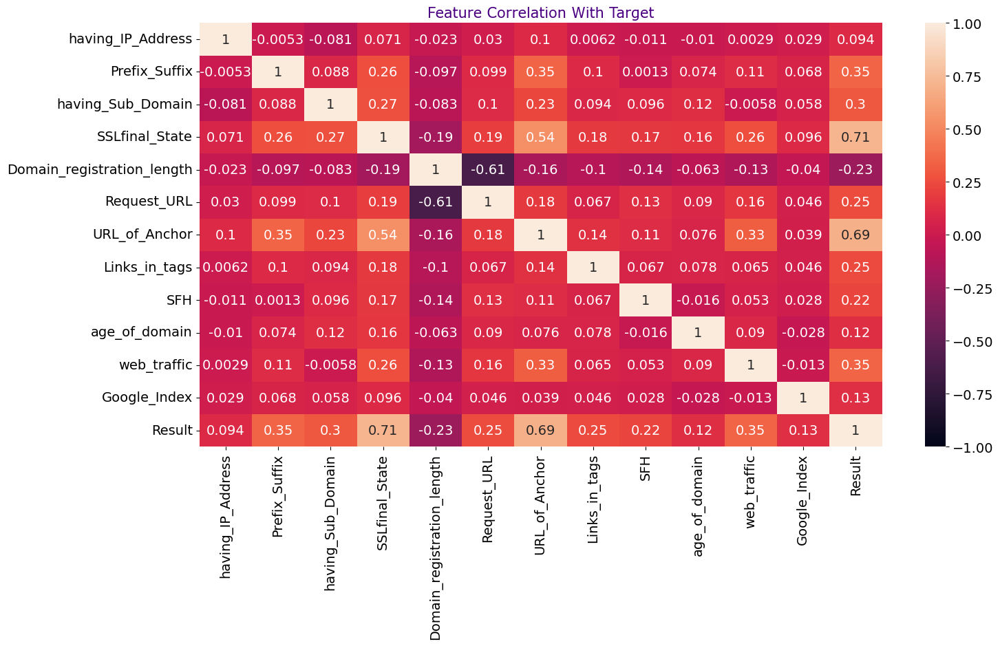

In [29]:
#correlation of selected features with target varible

corr_with_target = final_data.corr()
plt.figure(figsize=(16,8))
heatmap = sns.heatmap(corr_with_target, vmin=-1, vmax=1, annot=True)
heatmap.set_title('Feature Correlation With Target',color='indigo', font='Verdana', fontsize=15)

In [30]:
#Put features and target in a new dataframe
y = final_data.Result
X = final_data.drop(['Result'], axis=1)


In [31]:
# split X and y into training and testing sets

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [32]:
# checking the shape of the train and test datasets

print("The shape of X_train is: ",X_train.shape)
print("The shape of X_test is: ",X_test.shape)
print("The shape of y_train is: ",y_train.shape)
print("The shape of y_test is: ",y_test.shape)

The shape of X_train is:  (8291, 12)
The shape of X_test is:  (2764, 12)
The shape of y_train is:  (8291,)
The shape of y_test is:  (2764,)


# Import and Train Models

### Base Models 

In [33]:

#logreg = LogisticRegression(C=0.1, penalty='l2', solver='liblinear', random_state=0, class_weight='balanced')
#logreg.fit(X_train, Y_train, sample_weight=sample_weights)

#Model instances
model_log = LogisticRegression()
model_ben = BernoulliNB()
model_svm = SVC(probability=True)
model_rdf = RandomForestClassifier()


#Train the model with data
model_log.fit(X_train, y_train)
model_ben.fit(X_train, y_train)
model_svm.fit(X_train, y_train)
model_rdf.fit(X_train, y_train)


RandomForestClassifier()

In [34]:
#Make predictions on test data to evaluate the model
y_log_pred = model_log.predict(X_test)
y_ben_pred = model_ben.predict(X_test)
y_svm_pred = model_svm.predict(X_test)
y_rdf_pred = model_rdf.predict(X_test)

In [35]:
target_labels = model_log.classes_
print(target_labels)

[-1  1]


In [36]:
models_dict = {"log": model_log, "ben": model_ben, "svm": model_svm, "rdf": model_rdf}
models_trained = [model_log, model_ben, model_svm, model_rdf]
training_accuracy = []
test_accuracy = []
precision = []
recall = []
f1 = []


for model in models_trained:
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    training_accuracy.append(accuracy_score(y_train,y_train_pred))
    test_accuracy.append(accuracy_score(y_test,y_test_pred))
    precision.append(precision_score(y_test,  y_test_pred, average='weighted'))
    recall.append(recall_score(y_test,  y_test_pred, average='weighted'))
    f1.append(f1_score(y_test,  y_test_pred, average='weighted'))

In [37]:
#Get the confsion matrix for each model
cm_log = confusion_matrix(y_test, y_log_pred, labels=target_labels)
cm_ben = confusion_matrix(y_test, y_ben_pred, labels=target_labels)
cm_svm = confusion_matrix(y_test, y_svm_pred, labels=target_labels)
cm_rdf = confusion_matrix(y_test, y_rdf_pred, labels=target_labels)

print("Confusion Matrix Linear Model")
print(cm_log)
print('\n')
print("Confusion Matrix Bernoulli Model")
print(cm_ben)
print('\n')
print("Confusion Matrix SVM Model")
print(cm_svm)
print('\n')
print("Confusion Matrix Random Forest Model")
print(cm_rdf)

Confusion Matrix Linear Model
[[1060  123]
 [ 104 1477]]


Confusion Matrix Bernoulli Model
[[1055  128]
 [ 145 1436]]


Confusion Matrix SVM Model
[[1084   99]
 [  64 1517]]


Confusion Matrix Random Forest Model
[[1108   75]
 [  54 1527]]


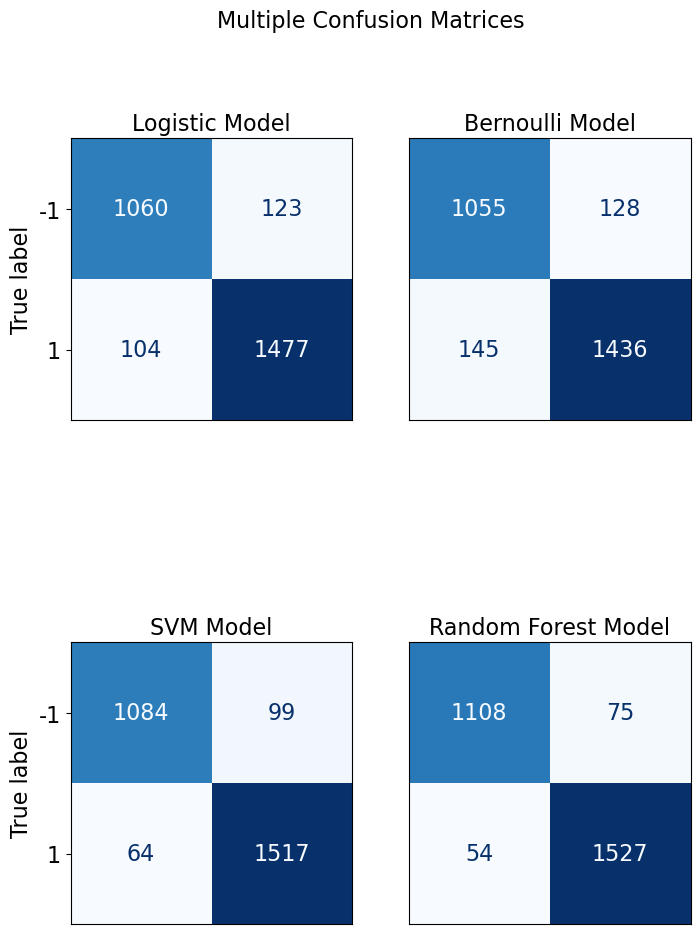

In [38]:
# Set formatting and styling options for the confusion matrices
title_size = 16
plt.rcParams.update({'font.size':16})
display_labels = target_labels  # Customize labels of the classes
colorbar = False
cmap = "Blues"  # Try "Greens". Change the color of the confusion matrix.
## Please see other alternatives at https://matplotlib.org/stable/tutorials/colors/colormaps.html
#values_format = ".3f"  # Determine the number of decimal places to be displayed.

# Create subplots for given confusion matrices
f, axes = plt.subplots(2, 2, figsize=(8, 12))

# Plot the first confusion matrix (Model 1) at position (0, 0)
axes[0, 0].set_title("Logistic Model", size=title_size)
ConfusionMatrixDisplay(confusion_matrix=cm_log, display_labels=display_labels).plot(
    include_values=True, cmap=cmap, ax=axes[0, 0], colorbar=colorbar)

# Remove x-axis labels and ticks
axes[0, 0].xaxis.set_ticklabels(['', ''])
axes[0, 0].set_xlabel('')
axes[0, 0].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)


# Plot the second confusion matrix (Model 2) at position (0, 1)
axes[0, 1].set_title("Bernoulli Model", size=title_size)
ConfusionMatrixDisplay(confusion_matrix=cm_ben, display_labels=display_labels).plot(
    include_values=True, cmap=cmap, ax=axes[0, 1], colorbar=colorbar)

# Remove x and y-axis labels and ticks
axes[0, 1].xaxis.set_ticklabels(['', ''])
axes[0, 1].yaxis.set_ticklabels(['', ''])
axes[0, 1].set_xlabel('')
axes[0, 1].set_ylabel('')
axes[0, 1].tick_params(axis='both', which='both', bottom=False, left=False)

# Plot the third confusion matrix (Model 3) at position (1, 0)
axes[1, 0].set_title("SVM Model", size=title_size)
ConfusionMatrixDisplay(confusion_matrix=cm_svm, display_labels=display_labels).plot(
    include_values=True, cmap=cmap, ax=axes[1, 0], colorbar=colorbar)

# Remove x-axis labels and ticks
axes[1, 0].xaxis.set_ticklabels(['', ''])
axes[1, 0].set_xlabel('')
axes[1, 0].tick_params(axis='x', which='both', bottom=False)

# Plot the fourth confusion matrix (Model 4) at position (1, 1)
axes[1, 1].set_title("Random Forest Model", size=title_size)
ConfusionMatrixDisplay(confusion_matrix=cm_rdf, display_labels=display_labels).plot(
    include_values=True, cmap=cmap, ax=axes[1, 1], colorbar=colorbar)

# Remove x and y-axis labels and ticks for Model 4
axes[1, 1].xaxis.set_ticklabels(['', ''])
axes[1, 1].yaxis.set_ticklabels(['', ''])
axes[1, 1].set_xlabel('')
axes[1, 1].set_ylabel('')
axes[1, 1].tick_params(axis='both', which='both',bottom=False, left=False)


# Set the figure's suptitle and display the plot
f.suptitle("Multiple Confusion Matrices", size=title_size, y=0.93)

plt.show()

# Save the figure as a PDF file
#f.savefig("multiple_confusion_matrices.pdf", bbox_inches='tight')

In [39]:
#Check classification Report
crp_log = classification_report(y_test, y_log_pred, labels=target_labels)
crp_ben = classification_report(y_test, y_ben_pred, labels=target_labels)
crp_svm = classification_report(y_test, y_svm_pred, labels=target_labels)
crp_rdf = classification_report(y_test, y_rdf_pred, labels=target_labels)

print('Logistic Model Report')
print(crp_log)
print('\n')
print('Bernoulli Model Report')
print(crp_ben)
print('\n')
print('SVM Model Report')
print(crp_svm)
print('\n')
print('Radom Forest Model Report')
print(crp_rdf)


Logistic Model Report
              precision    recall  f1-score   support

          -1       0.91      0.90      0.90      1183
           1       0.92      0.93      0.93      1581

    accuracy                           0.92      2764
   macro avg       0.92      0.92      0.92      2764
weighted avg       0.92      0.92      0.92      2764



Bernoulli Model Report
              precision    recall  f1-score   support

          -1       0.88      0.89      0.89      1183
           1       0.92      0.91      0.91      1581

    accuracy                           0.90      2764
   macro avg       0.90      0.90      0.90      2764
weighted avg       0.90      0.90      0.90      2764



SVM Model Report
              precision    recall  f1-score   support

          -1       0.94      0.92      0.93      1183
           1       0.94      0.96      0.95      1581

    accuracy                           0.94      2764
   macro avg       0.94      0.94      0.94      2764
weighted

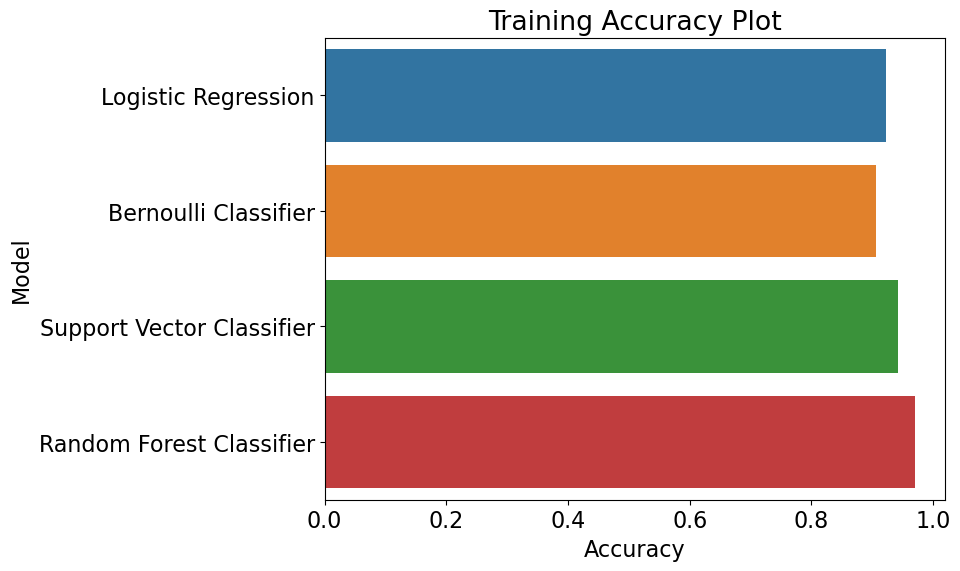

In [40]:
#Create a list for models
models = ['Logistic Regression','Bernoulli Classifier', 'Support Vector Classifier','Random Forest Classifier']

#visualizing the train model accuracy
plt.figure(figsize=(8, 6))
sns.barplot(x=training_accuracy, y=models)
plt.title('Training Accuracy Plot')
plt.xlabel('Accuracy')
plt.ylabel('Model')

plt.show()

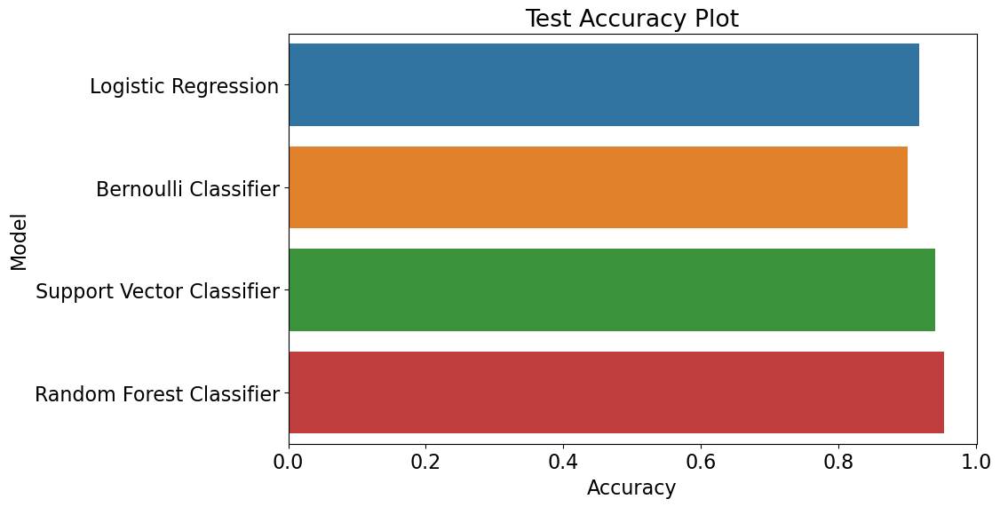

In [41]:
# visualizing the test model accuracy
plt.figure(figsize=(10, 6))
sns.barplot(x=test_accuracy, y=models)
plt.title('Test Accuracy Plot')
plt.xlabel('Accuracy')
plt.ylabel('Model')

plt.show()

In [42]:
#plot a table to show performance
    
model_metrics = pd.DataFrame({'Model':models,'Train Score':training_accuracy,'Test Score':test_accuracy, 'Precision': precision, 'Recall': recall, 'F1-Score': f1})
model_metrics

,Model,Train Score,Test Score,Precision,Recall,F1-Score
0,Logistic Regression,0.922567,0.917873,0.917787,0.917873,0.917785
1,Bernoulli Classifier,0.905922,0.901230,0.901470,0.901230,0.901315
2,Support Vector Classifier,0.942468,0.941027,0.941097,0.941027,0.940908
3,Random Forest Classifier,0.970329,0.953329,0.953331,0.953329,0.953273


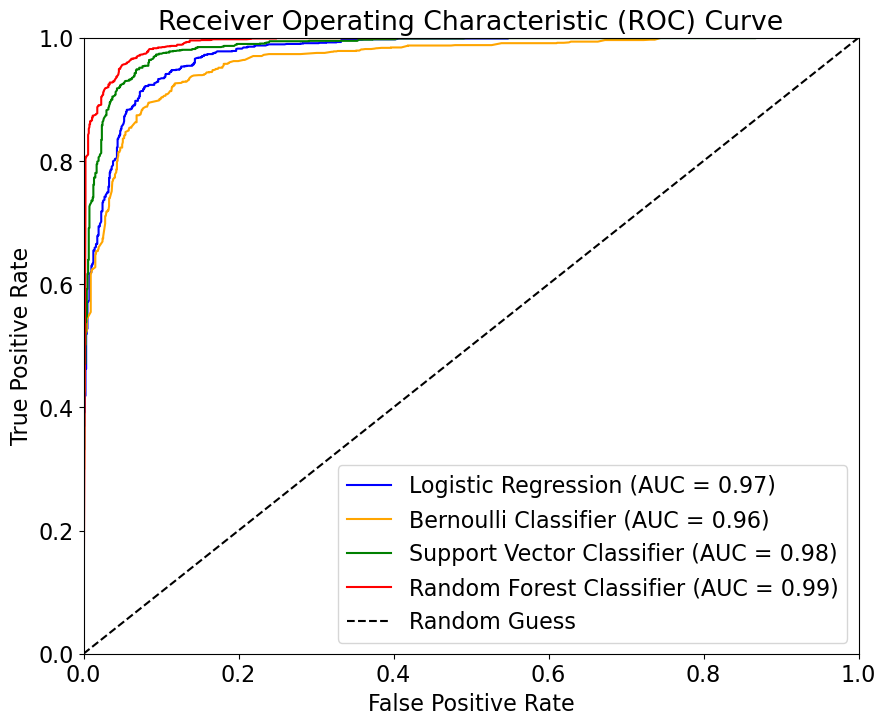

In [43]:
#ROC PLOTS
models = ['Logistic Regression','Bernoulli Classifier', 'Support Vector Classifier','Random Forest Classifier']

colors = ['blue', 'orange', 'green', 'red']

plt.figure(figsize=(10, 8))

for i, model in enumerate(models_trained):
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    auc = roc_auc_score(y_test, y_pred_prob)
    plt.plot(fpr, tpr, color=colors[i], label=models[i] + ' (AUC = {:.2f})'.format(auc))

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

In [44]:
#https://scikit-learn.org/stable/modules/linear_model.html

# Model Optimization

This will be done through hyperparamter tuning so that the models can perform better.
Optimization is also done to avoid model overfitting.

In [45]:
# split X and y into training and testing sets
X_train1, X_test, y_train1, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [46]:
from imblearn.over_sampling import SMOTE
smote = SMOTE(random_state=42)

X_train, y_train = smote.fit_resample(X_train1, y_train1)

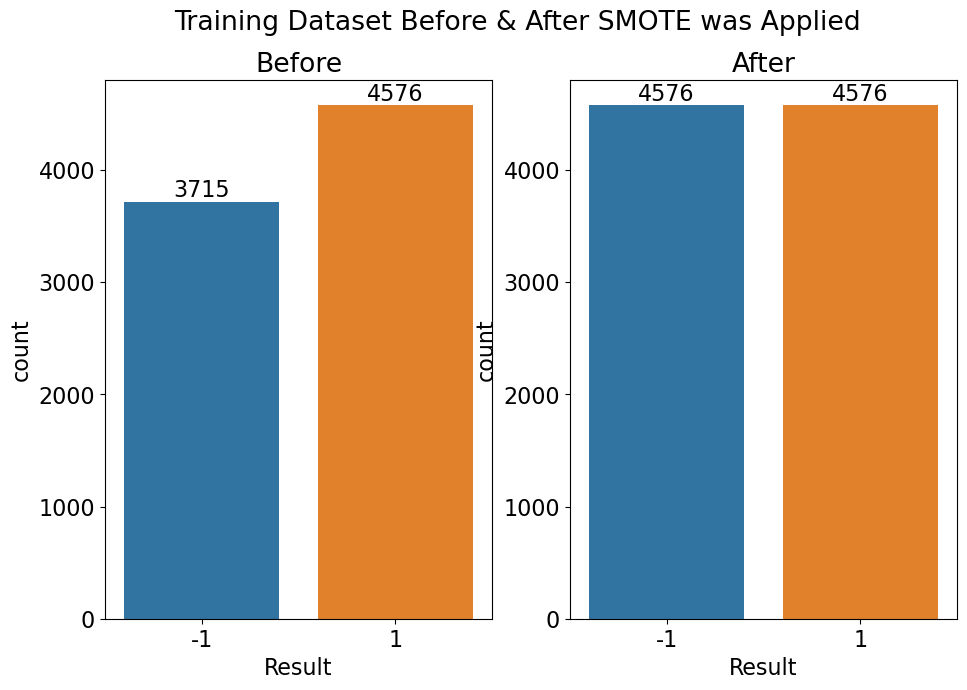

In [47]:
#Training data before and after Applying SMOTE
 
before = pd.DataFrame({'Result':y_train1})
after = pd.DataFrame({'Result':y_train})

fig, axs = plt.subplots(ncols= 2, figsize=(11,7))
sns.countplot(x='Result', data=before, ax=axs[0])

axs[0].bar_label(axs[0].containers[0])
axs[0].set_title('Before')

sns.countplot(x='Result', data=after, ax=axs[1])
axs[1].bar_label(axs[1].containers[0])
axs[1].set_title('After')
fig.suptitle(f"Training Dataset Before & After SMOTE was Applied")

plt.show()
print('\n')

In [48]:
#Optimised model metrics
opti_train_accuracy = []
opti_test_accuracy = []
opti_precision = []
opti_recall = []
opti_f1 = []



In [49]:
#Grid searching key hyperparametres for logistic regression with RepeatedStratifiedKFold validation

# define models and parameters
model = LogisticRegression(class_weight="balanced", random_state=42)
solvers = ['liblinear']
penalty = ['l1', 'l2']
c_values = [100, 10, 1.0, 0.1, 0.01]

# define grid search
log_grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)
grid_search = GridSearchCV(estimator=model, param_grid=log_grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
log_grid_result = grid_search.fit(X_train, y_train)

# summarize results
print("Best: %f using %s" % (log_grid_result.best_score_, log_grid_result.best_params_))
means = log_grid_result.cv_results_['mean_test_score']
stds = log_grid_result.cv_results_['std_test_score']
params = log_grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
    

#Get thr best model
best_log_model = log_grid_result.best_estimator_

# Get the training accuracy score
train_log_accuracy = best_log_model.score(X_train, y_train)

# Evaluate the final model on the test data
log_y_pred = best_log_model.predict(X_test)
log_accuracy = accuracy_score(y_test, log_y_pred)
log_confusion = confusion_matrix(y_test, log_y_pred)
log_class_report = classification_report(y_test, log_y_pred)
log_precision = precision_score(y_test,  log_y_pred, average='weighted')
log_recall = recall_score(y_test,  log_y_pred, average='weighted')
log_f1 = f1_score(y_test,  log_y_pred, average='weighted')

#Append to metrics list
opti_train_accuracy.append(train_log_accuracy)
opti_test_accuracy.append(log_accuracy)
opti_precision.append(log_precision)
opti_recall.append(log_recall)
opti_f1.append(log_f1)

# Print the evaluation results
print("\n")
print("Logistic Regression Classifier\n")
print("Training Accuracy:", train_log_accuracy)
print("Test Accuracy:", log_accuracy)
print("\n")
#Confusion marix and classification Report
print("Confusion matrix:\n", log_confusion)
print("\n")
print("Classification report:\n", classification_report(y_test, log_y_pred))

Best: 0.920127 using {'C': 0.01, 'penalty': 'l2', 'solver': 'liblinear'}
0.919617 (0.005751) with: {'C': 100, 'penalty': 'l1', 'solver': 'liblinear'}
0.919617 (0.005751) with: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
0.919617 (0.005751) with: {'C': 10, 'penalty': 'l1', 'solver': 'liblinear'}
0.919617 (0.005751) with: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
0.919617 (0.005734) with: {'C': 1.0, 'penalty': 'l1', 'solver': 'liblinear'}
0.919726 (0.005728) with: {'C': 1.0, 'penalty': 'l2', 'solver': 'liblinear'}
0.919763 (0.005950) with: {'C': 0.1, 'penalty': 'l1', 'solver': 'liblinear'}
0.920054 (0.005320) with: {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
0.914846 (0.004961) with: {'C': 0.01, 'penalty': 'l1', 'solver': 'liblinear'}
0.920127 (0.005648) with: {'C': 0.01, 'penalty': 'l2', 'solver': 'liblinear'}


Logistic Regression Classifier

Training Accuracy: 0.9205638111888111
Test Accuracy: 0.918958031837916


Confusion matrix:
 [[1070  113]
 [ 111 1470]]


Cl

In [50]:
#Grid searching key hyperparametres for BernoulliNB with RepeatedStratifiedKFold validation

# define models and parameters
model = BernoulliNB()
alpha = [1e-3, 1e-2, 1e-1, 1.0, 1.5, 2.0, 2.5, 3.0, 3.5, 5.0]

# define grid search
ben_grid = dict(alpha=alpha)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)
grid_search = GridSearchCV(estimator=model, param_grid=ben_grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
ben_grid_result = grid_search.fit(X_train, y_train)

# summarize results
print("Best: %f using %s" % (ben_grid_result.best_score_, ben_grid_result.best_params_))
means = ben_grid_result.cv_results_['mean_test_score']
stds = ben_grid_result.cv_results_['std_test_score']
params = ben_grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
    
    
#Get thr best model
best_ben_model = ben_grid_result.best_estimator_

# Get the training accuracy score
train_ben_accuracy = best_ben_model.score(X_train, y_train)

# Evaluate the final model on the test data
ben_y_pred = best_ben_model.predict(X_test)
ben_accuracy = accuracy_score(y_test, ben_y_pred)
ben_confusion = confusion_matrix(y_test, ben_y_pred)
ben_class_report = classification_report(y_test, ben_y_pred)
ben_precision = precision_score(y_test,  ben_y_pred, average='weighted')
ben_recall = recall_score(y_test,  ben_y_pred, average='weighted')
ben_f1 = f1_score(y_test,  ben_y_pred, average='weighted')

#Append to metrics list
opti_train_accuracy.append(train_ben_accuracy)
opti_test_accuracy.append(ben_accuracy)
opti_precision.append(ben_precision)
opti_recall.append(ben_recall)
opti_f1.append(ben_f1)


# Print the evaluation results
print("\n")
print("Bernoulli Classifier\n")
print("Training Accuracy:", train_ben_accuracy)
print("Test Accuracy:", ben_accuracy)
print("\n")
#Confusion marix and classification Report
print("Confusion matrix:\n", ben_confusion)
print("\n")
print("Classification report:\n", ben_class_report)


Best: 0.907488 using {'alpha': 0.001}
0.907488 (0.005020) with: {'alpha': 0.001}
0.907488 (0.005020) with: {'alpha': 0.01}
0.907488 (0.005020) with: {'alpha': 0.1}
0.907488 (0.005020) with: {'alpha': 1.0}
0.907488 (0.005020) with: {'alpha': 1.5}
0.907488 (0.005020) with: {'alpha': 2.0}
0.907415 (0.005048) with: {'alpha': 2.5}
0.907270 (0.005070) with: {'alpha': 3.0}
0.907270 (0.005070) with: {'alpha': 3.5}
0.906723 (0.005047) with: {'alpha': 5.0}


Bernoulli Classifier

Training Accuracy: 0.9075611888111889
Test Accuracy: 0.9015918958031838


Confusion matrix:
 [[1067  116]
 [ 156 1425]]


Classification report:
               precision    recall  f1-score   support

          -1       0.87      0.90      0.89      1183
           1       0.92      0.90      0.91      1581

    accuracy                           0.90      2764
   macro avg       0.90      0.90      0.90      2764
weighted avg       0.90      0.90      0.90      2764



In [51]:
#Grid searching key hyperparametres for Simple Vector Classifier with RepeatedStratifiedKFold validation

# define models and parameters
model = SVC(random_state=42)
C = [0.1, 1, 10, 100, 1000],
gamma = [1.0, 0.1, 0.01, 0.001, 0.0001],
kernels = ['rbf', 'linear', 'poly', 'sigmoid'],
class_weight = ['balanced']
svc_grid = {'C': [1, 10, 100],
			'gamma': [1.0, 0.1, 0.01, 0.001],
			'kernel': ['linear', 'rbf'],
      'class_weight': ['balanced']
              }

# define grid search
#svc_grid = dict(C=C, gamma=gamma, kernel=kernels, class_weight=class_weight)
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)
grid_search = GridSearchCV(estimator=model, param_grid=svc_grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
svc_grid_result = grid_search.fit(X_train, y_train)

# summarize results
print("Best: %f using %s" % (svc_grid_result.best_score_, svc_grid_result.best_params_))
means = svc_grid_result.cv_results_['mean_test_score']
stds = svc_grid_result.cv_results_['std_test_score']
params = svc_grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
    
    
#Get thr best model
best_svc_model = SVC(**svc_grid_result.best_params_, random_state=42, probability=True)
best_svc_model.fit(X_train, y_train)

# Get the training accuracy score
train_svc_accuracy = best_svc_model.score(X_train, y_train)

# Evaluate the final model on the test data
svc_y_pred = best_svc_model.predict(X_test)
svc_accuracy = accuracy_score(y_test, svc_y_pred)
svc_confusion = confusion_matrix(y_test, svc_y_pred)
svc_class_report = classification_report(y_test, svc_y_pred)
svc_precision = precision_score(y_test,  svc_y_pred, average='weighted')
svc_recall = recall_score(y_test,  svc_y_pred, average='weighted')
svc_f1 = f1_score(y_test,  svc_y_pred, average='weighted')

#Append to metrics list
opti_train_accuracy.append(train_svc_accuracy)
opti_test_accuracy.append(svc_accuracy)
opti_precision.append(svc_precision)
opti_recall.append(svc_recall)
opti_f1.append(svc_f1)


# Print the evaluation results
print("\n")
print("Support Vector Classifier\n")
print("Training Accuracy:", train_svc_accuracy)
print("Test Accuracy:", svc_accuracy)
print("\n")
#Confusion marix and classification Report
print("Confusion matrix:\n", svc_confusion)
print("\n")
print("Classification report:\n", svc_class_report)


Best: 0.949956 using {'C': 100, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}
0.918707 (0.005351) with: {'C': 1, 'class_weight': 'balanced', 'gamma': 1.0, 'kernel': 'linear'}
0.945440 (0.002808) with: {'C': 1, 'class_weight': 'balanced', 'gamma': 1.0, 'kernel': 'rbf'}
0.918707 (0.005351) with: {'C': 1, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'linear'}
0.936116 (0.005319) with: {'C': 1, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}
0.918707 (0.005351) with: {'C': 1, 'class_weight': 'balanced', 'gamma': 0.01, 'kernel': 'linear'}
0.919435 (0.005347) with: {'C': 1, 'class_weight': 'balanced', 'gamma': 0.01, 'kernel': 'rbf'}
0.918707 (0.005351) with: {'C': 1, 'class_weight': 'balanced', 'gamma': 0.001, 'kernel': 'linear'}
0.915757 (0.005844) with: {'C': 1, 'class_weight': 'balanced', 'gamma': 0.001, 'kernel': 'rbf'}
0.918670 (0.005380) with: {'C': 10, 'class_weight': 'balanced', 'gamma': 1.0, 'kernel': 'linear'}
0.944529 (0.003259) with: {'C': 10, 'clas

In [52]:
#Grid searching key hyperparametres for Random Forest Classifier with RepeatedStratifiedKFold validation

# define models and parameters
model = RandomForestClassifier(random_state=42)

rdf_grid = {
    'n_estimators': [100, 150, 200, 250],
    'max_depth': [6, 9, 12, 15],
    'min_samples_split': [2,3,4]
}

# define grid search
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=42)
grid_search = GridSearchCV(estimator=model, param_grid=rdf_grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
rdf_grid_result = grid_search.fit(X_train, y_train)

# summarize results
print("Best: %f using %s" % (rdf_grid_result.best_score_, rdf_grid_result.best_params_))
means = rdf_grid_result.cv_results_['mean_test_score']
stds = rdf_grid_result.cv_results_['std_test_score']
params = rdf_grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))
    
    
#Get thr best model
best_rdf_model = rdf_grid_result.best_estimator_

# Get the training accuracy score
train_rdf_accuracy = best_rdf_model.score(X_train, y_train)

# Evaluate the final model on the test data
rdf_y_pred = best_rdf_model.predict(X_test)
rdf_accuracy = accuracy_score(y_test, rdf_y_pred)
rdf_confusion = confusion_matrix(y_test, rdf_y_pred)
rdf_class_report = classification_report(y_test, rdf_y_pred)
rdf_precision = precision_score(y_test,  rdf_y_pred, average='weighted')
rdf_recall = recall_score(y_test,  rdf_y_pred, average='weighted')
rdf_f1 = f1_score(y_test,  rdf_y_pred, average='weighted')

#Append to metrics list
opti_train_accuracy.append(train_rdf_accuracy)
opti_test_accuracy.append(rdf_accuracy)
opti_precision.append(rdf_precision)
opti_recall.append(rdf_recall)
opti_f1.append(rdf_f1)


# Print the evaluation results
print("\n")
print("Random Forest Classifier\n")
print("Training Accuracy:", train_rdf_accuracy)
print("Test Accuracy:", rdf_accuracy)
print("\n")
#Confusion marix and classification Report
print("Confusion matrix:\n", rdf_confusion)
print("\n")
print("Classification report:\n", rdf_class_report)


Best: 0.952579 using {'max_depth': 12, 'min_samples_split': 3, 'n_estimators': 250}
0.929232 (0.005610) with: {'max_depth': 6, 'min_samples_split': 2, 'n_estimators': 100}
0.929123 (0.004984) with: {'max_depth': 6, 'min_samples_split': 2, 'n_estimators': 150}
0.928577 (0.005005) with: {'max_depth': 6, 'min_samples_split': 2, 'n_estimators': 200}
0.928868 (0.005042) with: {'max_depth': 6, 'min_samples_split': 2, 'n_estimators': 250}
0.929269 (0.005642) with: {'max_depth': 6, 'min_samples_split': 3, 'n_estimators': 100}
0.929087 (0.005006) with: {'max_depth': 6, 'min_samples_split': 3, 'n_estimators': 150}
0.928540 (0.004955) with: {'max_depth': 6, 'min_samples_split': 3, 'n_estimators': 200}
0.928832 (0.005075) with: {'max_depth': 6, 'min_samples_split': 3, 'n_estimators': 250}
0.929305 (0.005592) with: {'max_depth': 6, 'min_samples_split': 4, 'n_estimators': 100}
0.928941 (0.004895) with: {'max_depth': 6, 'min_samples_split': 4, 'n_estimators': 150}
0.928613 (0.005088) with: {'max_dept

In [53]:
#plot a table to show performance

optimised_metrics = pd.DataFrame({'Model': models,'Opt Train Score':opti_train_accuracy,'Opt Test Score':opti_test_accuracy, 'Opt Precision': opti_precision, 'Opt Recall': opti_recall, 'Opt F1-Score': opti_f1})
optimised_metrics

,Model,Opt Train Score,Opt Test Score,Opt Precision,Opt Recall,Opt F1-Score
0,Logistic Regression,0.920564,0.918958,0.918942,0.918958,0.918949
1,Bernoulli Classifier,0.907561,0.901592,0.902348,0.901592,0.901780
2,Support Vector Classifier,0.967220,0.948625,0.948801,0.948625,0.948672
3,Random Forest Classifier,0.964489,0.955861,0.955871,0.955861,0.955866


In [54]:
#Compare metrics of base and optimised models
combined_performance_df = pd.concat([model_metrics,optimised_metrics.drop("Model", axis=1)], axis=1)
combined_performance_df

,Model,Train Score,Test Score,Precision,Recall,F1-Score,Opt Train Score,Opt Test Score,Opt Precision,Opt Recall,Opt F1-Score
0,Logistic Regression,0.922567,0.917873,0.917787,0.917873,0.917785,0.920564,0.918958,0.918942,0.918958,0.918949
1,Bernoulli Classifier,0.905922,0.901230,0.901470,0.901230,0.901315,0.907561,0.901592,0.902348,0.901592,0.901780
2,Support Vector Classifier,0.942468,0.941027,0.941097,0.941027,0.940908,0.967220,0.948625,0.948801,0.948625,0.948672
3,Random Forest Classifier,0.970329,0.953329,0.953331,0.953329,0.953273,0.964489,0.955861,0.955871,0.955861,0.955866


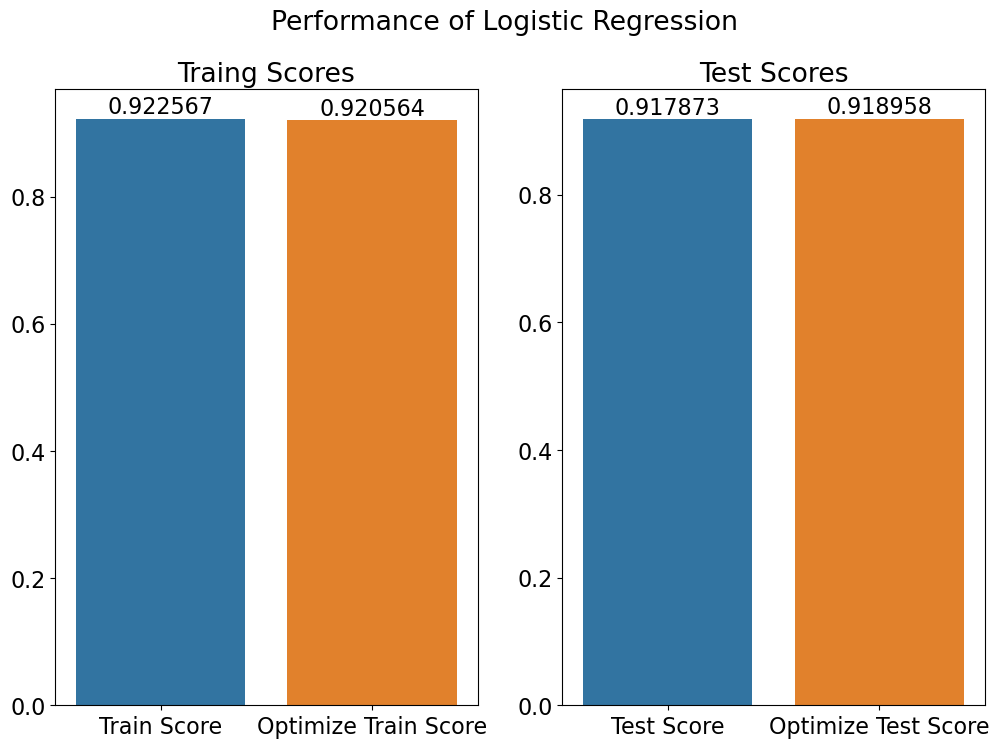

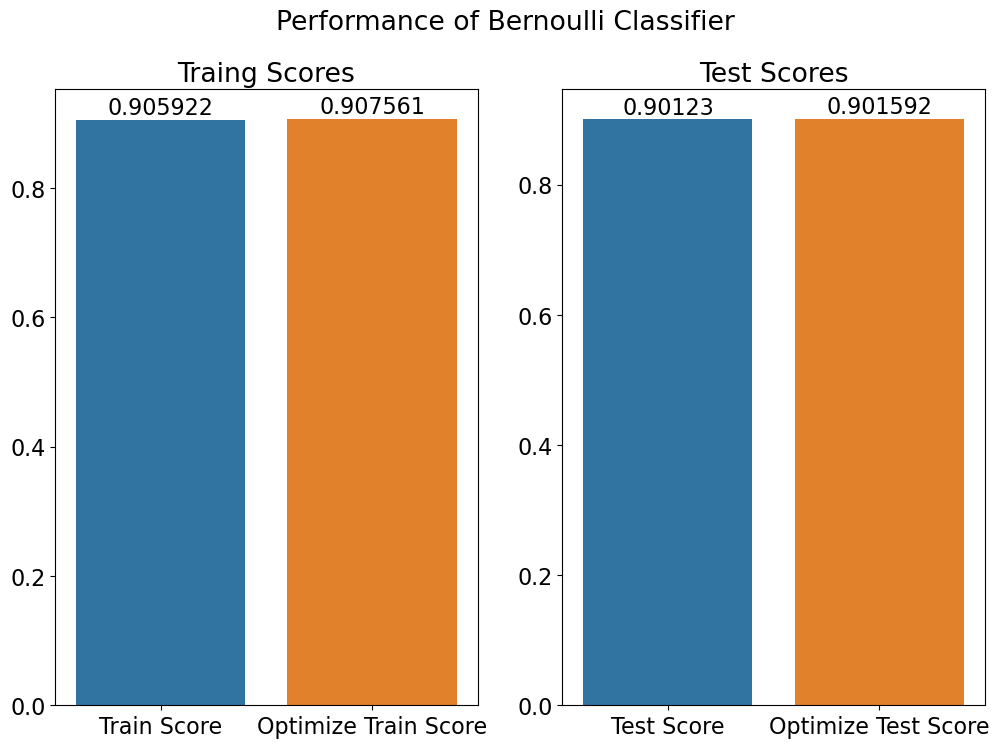

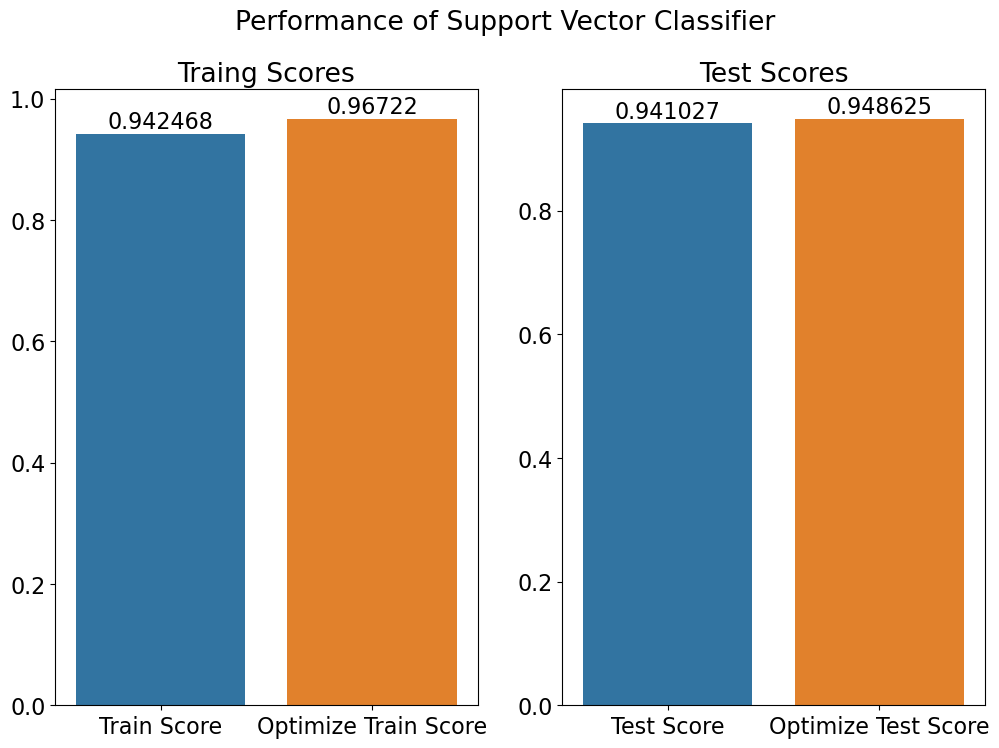

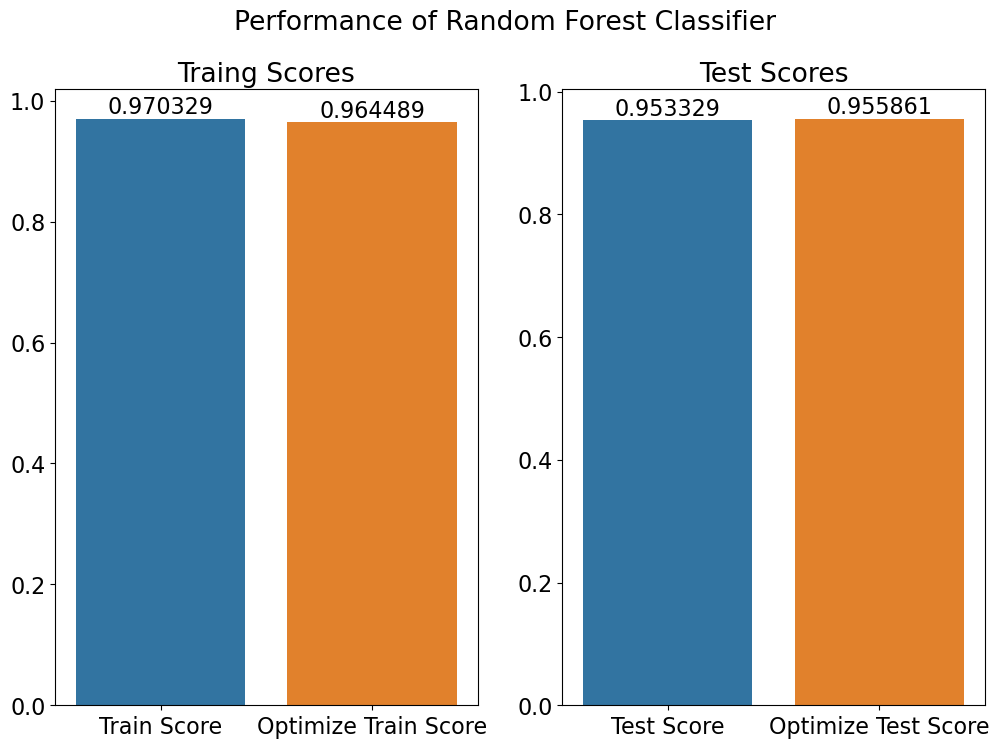

In [55]:
# Comparing performance of Base and Optimized Models
performance_df = combined_performance_df.drop("Model", axis=1)
for i in range(0, len(models)):
    fig, axs = plt.subplots(ncols= 2, figsize=(12,8))
    sns.barplot(y=[performance_df["Train Score"][i], performance_df["Opt Train Score"][i]], x=["Train Score", "Optimize Train Score"], ax=axs[0])

    axs[0].bar_label(axs[0].containers[0])
    axs[0].set_title('Traing Scores')

    sns.barplot(y=[performance_df["Test Score"][i], performance_df["Opt Test Score"][i]], x=["Test Score", "Optimize Test Score"], ax=axs[1])
    axs[1].bar_label(axs[1].containers[0])
    axs[1].set_title('Test Scores')
    fig.suptitle(f"Performance of {models[i]}")
    
    plt.show()
    print('\n')


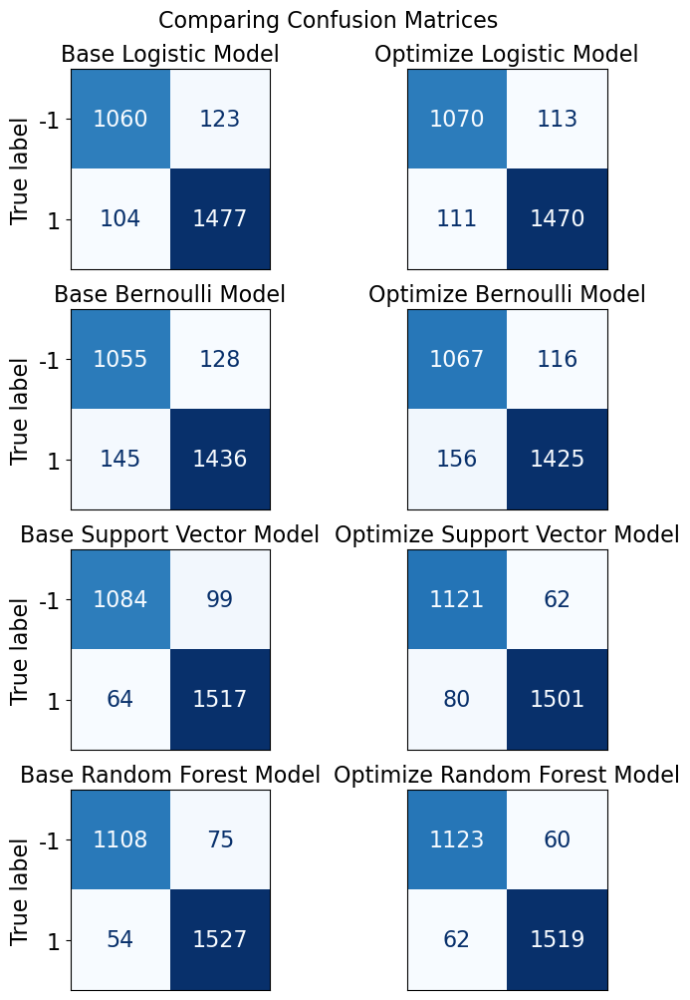

In [56]:
#Comparing Base and Optimzed Model Confusion Matrices

# Set formatting and styling options for the confusion matrices
title_size = 16
plt.rcParams.update({'font.size':16})
display_labels = target_labels  # Customize labels of the classes
colorbar = False
cmap = "Blues"  # Try "Greens". Change the color of the confusion matrix.
## Please see other alternatives at https://matplotlib.org/stable/tutorials/colors/colormaps.html
#values_format = ".3f"  # Determine the number of decimal places to be displayed.

# Create subplots for given confusion matrices
f, axes = plt.subplots(4, 2, figsize=(8, 12))

# Plot the first confusion matrix (Model 1) at position (0, 0)
axes[0, 0].set_title("Base Logistic Model", size=title_size)
ConfusionMatrixDisplay(confusion_matrix=cm_log, display_labels=display_labels).plot(
    include_values=True, cmap=cmap, ax=axes[0, 0], colorbar=colorbar)

# Remove x-axis labels and ticks
axes[0, 0].xaxis.set_ticklabels(['', ''])
axes[0, 0].set_xlabel('')
axes[0, 0].tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)


# Plot the second confusion matrix (Model 2) at position (0, 1)
axes[0, 1].set_title("Optimize Logistic Model", size=title_size)
ConfusionMatrixDisplay(confusion_matrix=log_confusion, display_labels=display_labels).plot(
    include_values=True, cmap=cmap, ax=axes[0, 1], colorbar=colorbar)

# Remove x and y-axis labels and ticks
axes[0, 1].xaxis.set_ticklabels(['', ''])
axes[0, 1].yaxis.set_ticklabels(['', ''])
axes[0, 1].set_xlabel('')
axes[0, 1].set_ylabel('')
axes[0, 1].tick_params(axis='both', which='both', bottom=False, left=False)



# Plot the third confusion matrix (Model 3) at position (1, 0)
axes[1, 0].set_title("Base Bernoulli Model", size=title_size)
ConfusionMatrixDisplay(confusion_matrix=cm_ben, display_labels=display_labels).plot(
    include_values=True, cmap=cmap, ax=axes[1, 0], colorbar=colorbar)

# Remove x-axis labels and ticks
axes[1, 0].xaxis.set_ticklabels(['', ''])
axes[1, 0].set_xlabel('')
axes[1, 0].tick_params(axis='x', which='both', bottom=False)



# Plot the fourth confusion matrix (Model 4) at position (1, 1)
axes[1, 1].set_title("Optimize Bernoulli Model", size=title_size)
ConfusionMatrixDisplay(confusion_matrix=ben_confusion, display_labels=display_labels).plot(
    include_values=True, cmap=cmap, ax=axes[1, 1], colorbar=colorbar)

# Remove x and y-axis labels and ticks for Model 4
axes[1, 1].xaxis.set_ticklabels(['', ''])
axes[1, 1].yaxis.set_ticklabels(['', ''])
axes[1, 1].set_xlabel('')
axes[1, 1].set_ylabel('')
axes[1, 1].tick_params(axis='both', which='both',bottom=False, left=False)


# Plot the 5 confusion matrix (Model 3) at position (2, 0)
axes[2, 0].set_title("Base Support Vector Model", size=title_size)
ConfusionMatrixDisplay(confusion_matrix=cm_svm, display_labels=display_labels).plot(
    include_values=True, cmap=cmap, ax=axes[2, 0], colorbar=colorbar)

# Remove x-axis labels and ticks
axes[2, 0].xaxis.set_ticklabels(['', ''])
axes[2, 0].set_xlabel('')
axes[2, 0].tick_params(axis='x', which='both', bottom=False)



# Plot the 6 confusion matrix (Model 4) at position (2, 1)
axes[2, 1].set_title("Optimize Support Vector Model", size=title_size)
ConfusionMatrixDisplay(confusion_matrix=svc_confusion, display_labels=display_labels).plot(
    include_values=True, cmap=cmap, ax=axes[2, 1], colorbar=colorbar)

# Remove x and y-axis labels and ticks for Model 4
axes[2, 1].xaxis.set_ticklabels(['', ''])
axes[2, 1].yaxis.set_ticklabels(['', ''])
axes[2, 1].set_xlabel('')
axes[2, 1].set_ylabel('')
axes[2, 1].tick_params(axis='both', which='both',bottom=False, left=False)



# Plot the 7 confusion matrix (Model 3) at position (3, 0)
axes[3, 0].set_title("Base Random Forest Model", size=title_size)
ConfusionMatrixDisplay(confusion_matrix=cm_rdf, display_labels=display_labels).plot(
    include_values=True, cmap=cmap, ax=axes[3, 0], colorbar=colorbar)

# Remove x-axis labels and ticks
axes[3, 0].xaxis.set_ticklabels(['', ''])
axes[3, 0].set_xlabel('')
axes[3, 0].tick_params(axis='x', which='both', bottom=False)


# Plot the 8 confusion matrix (Model 4) at position (3, 1)
axes[3, 1].set_title("Optimize Random Forest Model", size=title_size)
ConfusionMatrixDisplay(confusion_matrix=rdf_confusion, display_labels=display_labels).plot(
    include_values=True, cmap=cmap, ax=axes[3, 1], colorbar=colorbar)

# Remove x and y-axis labels and ticks for Model 4
axes[3, 1].xaxis.set_ticklabels(['', ''])
axes[3, 1].yaxis.set_ticklabels(['', ''])
axes[3, 1].set_xlabel('')
axes[3, 1].set_ylabel('')
axes[3, 1].tick_params(axis='both', which='both',bottom=False, left=False)


# Set the figure's suptitle and display the plot
f.suptitle("Comparing Confusion Matrices", size=title_size, y=0.93)

plt.show()

# Save the figure as a PDF file
#f.savefig("multiple_confusion_matrices.pdf", bbox_inches='tight')

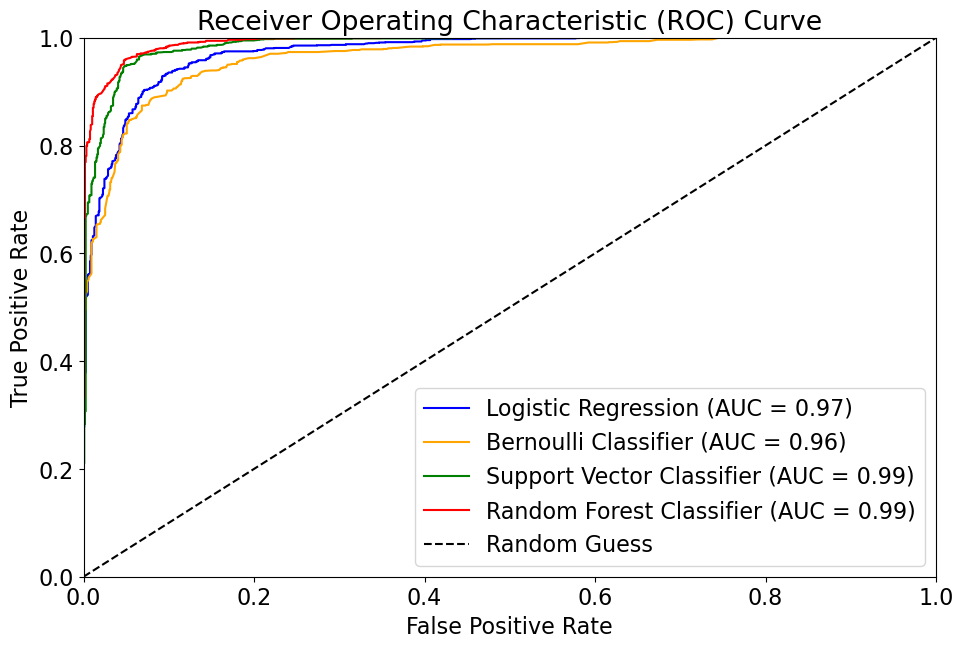

In [57]:
#ROC PLOTS FOR OPTIMIZED MODELS


models = ['Logistic Regression','Bernoulli Classifier', 'Support Vector Classifier','Random Forest Classifier']
models_optimized = [best_log_model, best_ben_model, best_svc_model, best_rdf_model]
colors = ['blue', 'orange', 'green', 'red']

plt.figure(figsize=(11, 7))

for i, model in enumerate(models_optimized):
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    auc = roc_auc_score(y_test, y_pred_prob)
    plt.plot(fpr, tpr, color=colors[i], label=models[i] + ' (AUC = {:.2f})'.format(auc))

plt.plot([0, 1], [0, 1], 'k--', label='Random Guess')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

# Model Explainability
We are going to try to understand how the models are able to make classifications.
What is the basis for decision making for the models.

## Feature Importance
The importance assigned to a feature by a model can influence the decisions made by the model 

In [58]:
# Let extract feature importances from Random Forest

importances = pd.DataFrame({'Feature': X_train.columns, 'Importance': best_rdf_model.feature_importances_})

importance_score = importances.sort_values(by='Importance', ascending=False).reset_index(drop=True)

importance_score 

,Feature,Importance
0,SSLfinal_State,0.370561
1,URL_of_Anchor,0.278472
2,web_traffic,0.079280
3,having_Sub_Domain,0.078670
4,Prefix_Suffix,0.051362
5,Links_in_tags,0.044315
6,Request_URL,0.022743
7,SFH,0.020890
8,Domain_registration_length,0.015918
9,age_of_domain,0.014325


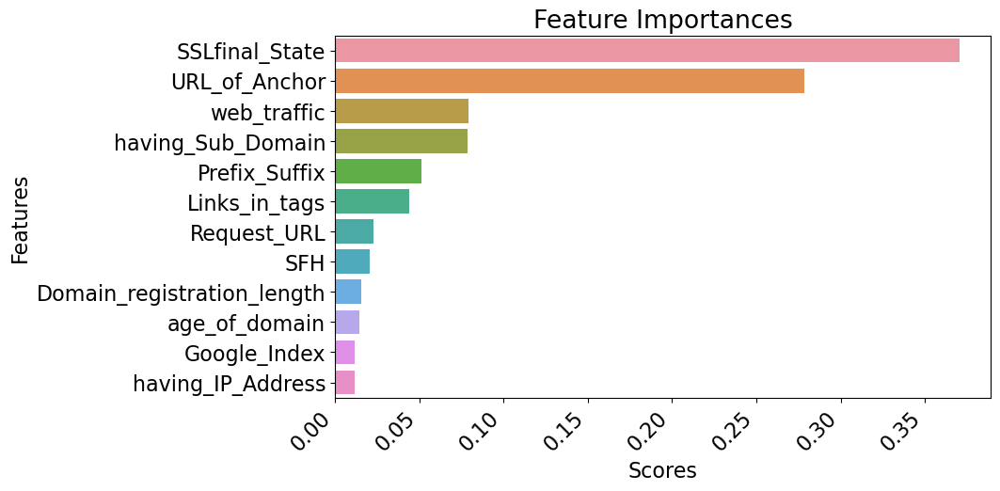

In [59]:
#Plot feature importances

plt.figure(figsize=(9, 5))
sns.barplot(x='Importance', y='Feature', data=importance_score)
plt.title('Feature Importances')
plt.xlabel('Scores')
plt.ylabel('Features')
plt.xticks(rotation=45, ha='right')
plt.show()

Using SHAP Library To Interpret Models 

In [60]:
#Initialize shap
shap.initjs()

In [61]:
# Let calculate sharp values
clf_log = best_log_model
explainer = shap.KernelExplainer(clf_log.predict, shap.kmeans(X_train, 100))
shap_values = explainer.shap_values(X_test)

  0%|          | 0/2764 [00:00<?, ?it/s]

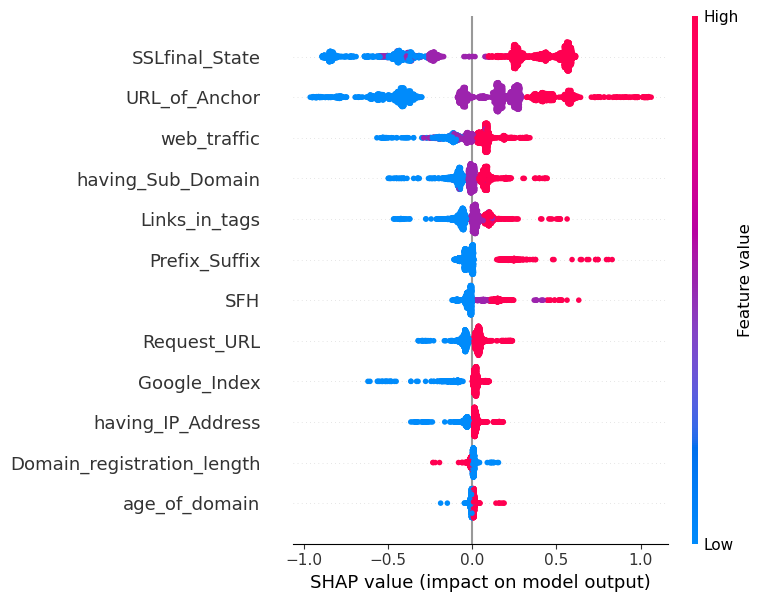

In [62]:
# A look at the forces applied by features to influence model output
shap.summary_plot(shap_values, X_test, feature_names= X_test.columns)

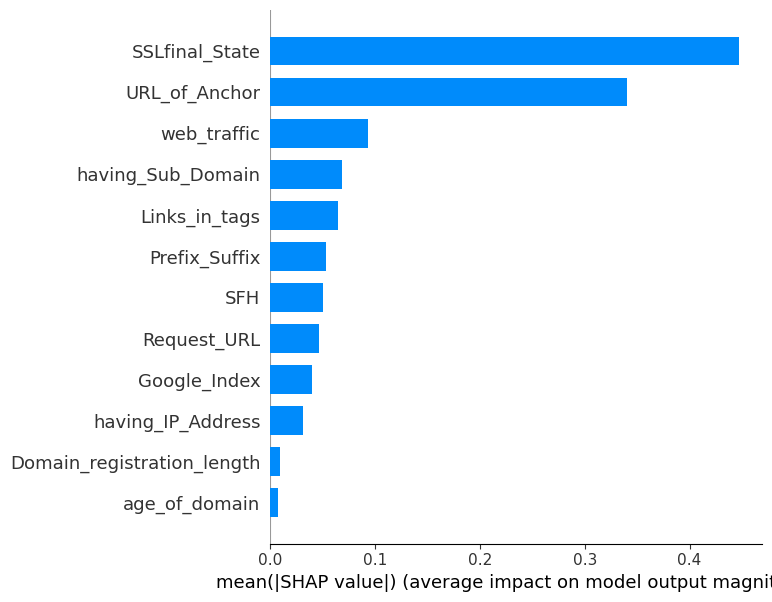

In [63]:
#The impact of each feature in decision making 
shap.summary_plot(shap_values, X_test, feature_names= X_test.columns, plot_type="bar")

In [64]:
X_test.head(15)


,having_IP_Address,Prefix_Suffix,having_Sub_Domain,SSLfinal_State,Domain_registration_length,Request_URL,URL_of_Anchor,Links_in_tags,SFH,age_of_domain,web_traffic,Google_Index
10582,-1,-1,-1,0,-1,-1,-1,-1,-1,1,0,1
7533,-1,-1,0,-1,-1,1,0,-1,-1,-1,1,1
10806,-1,-1,1,-1,1,1,0,0,-1,1,0,-1
2992,1,-1,0,1,-1,1,0,0,-1,-1,1,-1
8940,1,-1,1,1,1,-1,0,-1,1,1,1,-1
9054,1,-1,1,1,-1,1,0,-1,0,1,1,1
304,1,-1,0,1,1,-1,0,0,-1,-1,1,1
9644,1,-1,0,1,1,1,-1,-1,-1,1,0,1
5034,1,-1,-1,-1,-1,1,1,0,-1,-1,1,-1
1470,1,-1,1,1,-1,1,0,0,-1,1,0,1


In [65]:
#All features
col = ['having_IP_Address', 'Prefix_Suffix', 'having_Sub_Domain',
       'SSLfinal_State', 'Domain_registration_length', 'Request_URL',
       'URL_of_Anchor', 'Links_in_tags', 'SFH', 'age_of_domain', 'web_traffic',
       'Google_Index']

In [66]:
# A look at the forces applied by features to influence model outcome on a sample prediction

shap.force_plot(explainer.expected_value, shap_values[0], X_test.loc[10582], feature_names= X_test.columns)

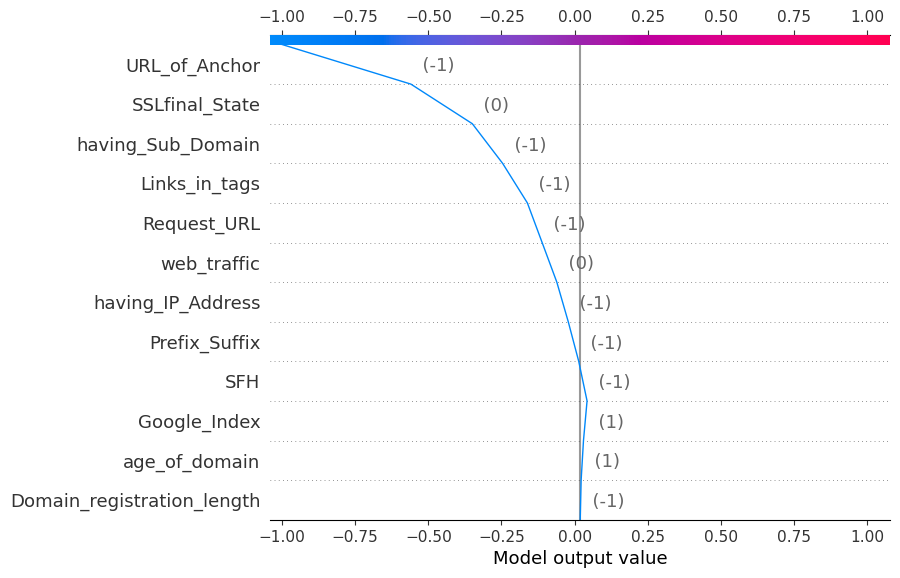

In [67]:
shap.decision_plot(explainer.expected_value, shap_values[0], X_test.loc[[10582]], feature_names= col)

In [68]:

shap.force_plot(explainer.expected_value, shap_values[1], X_test.loc[7533], feature_names= X_test.columns)

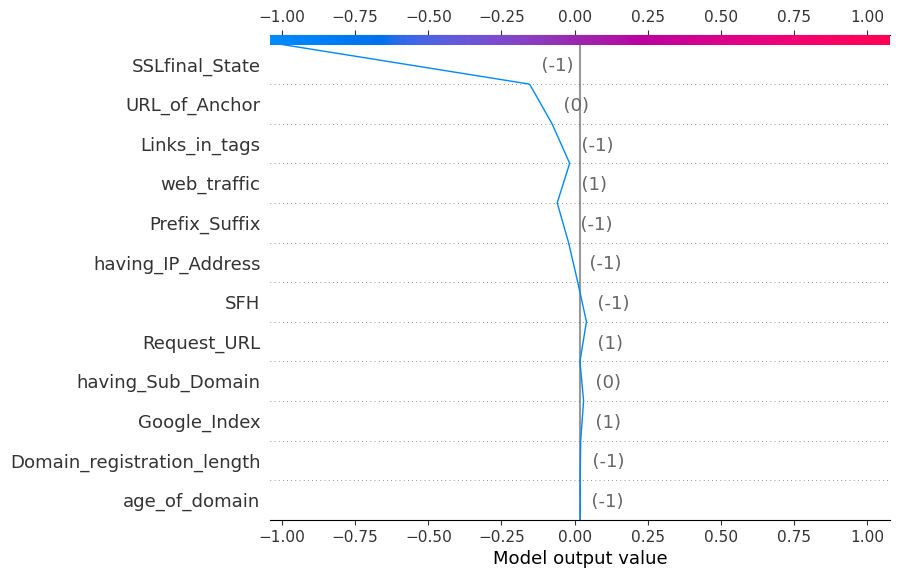

In [69]:
shap.decision_plot(explainer.expected_value, shap_values[1], X_test.loc[[7533]], feature_names= col)

In [70]:
# A look at the forces applied by features to influence model outcome on a sample prediction

shap.force_plot(explainer.expected_value, shap_values[3], X_test.loc[[2992]], feature_names= X_test.columns)

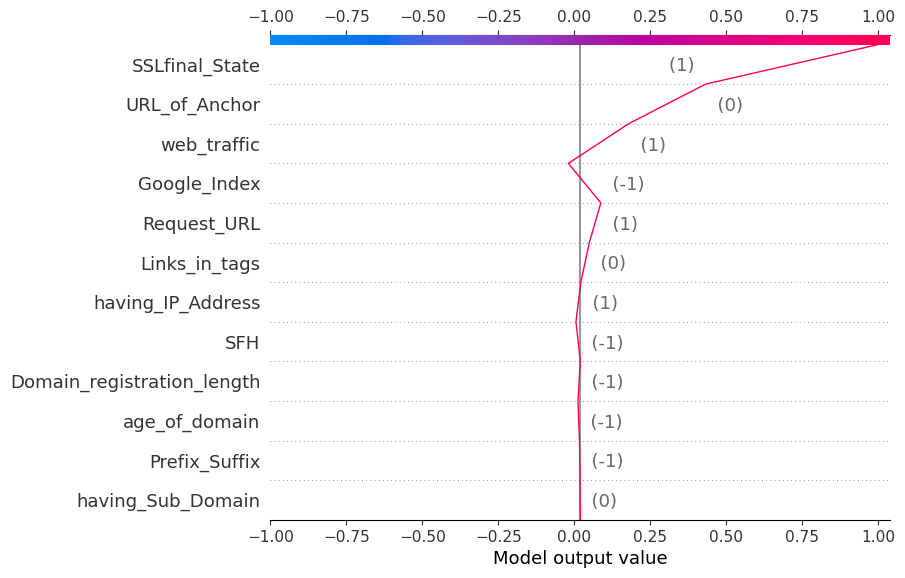

In [71]:
shap.decision_plot(explainer.expected_value, shap_values[3], X_test.loc[[2992]], feature_names= col)

In [72]:
# A look at the forces applied by features to influence model outcome on a sample prediction

shap.force_plot(explainer.expected_value, shap_values[4], X_test.loc[[8940]], feature_names= X_test.columns)

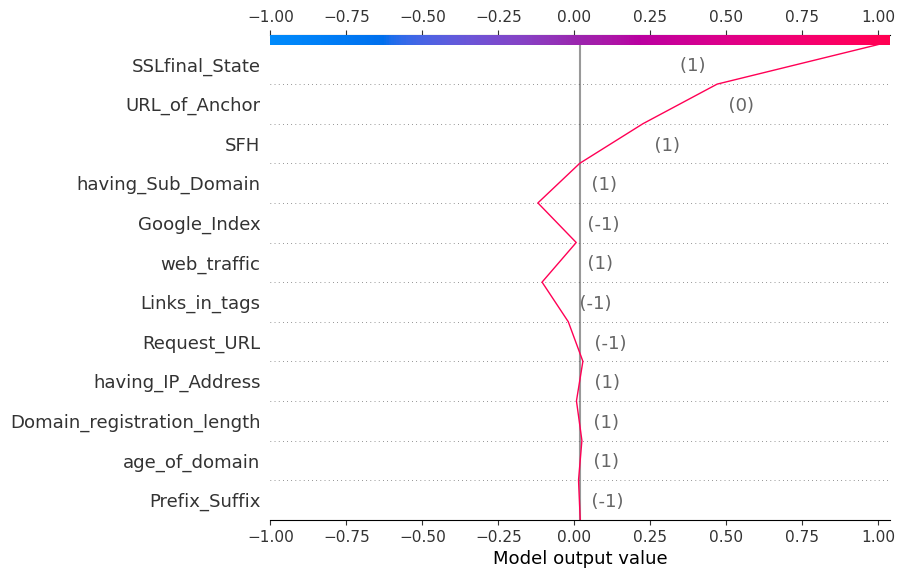

In [73]:
shap.decision_plot(explainer.expected_value, shap_values[4], X_test.loc[[8940]], feature_names= col)

In [76]:
#Use sample data to explain Random Forest Model
X_test_sample = X_test.sample(100)

clf_rdf = best_rdf_model
explainer = shap.KernelExplainer(clf_rdf.predict, shap.kmeans(X_train, 100))
shap_values = explainer.shap_values(X_test_sample)

  0%|          | 0/100 [00:00<?, ?it/s]

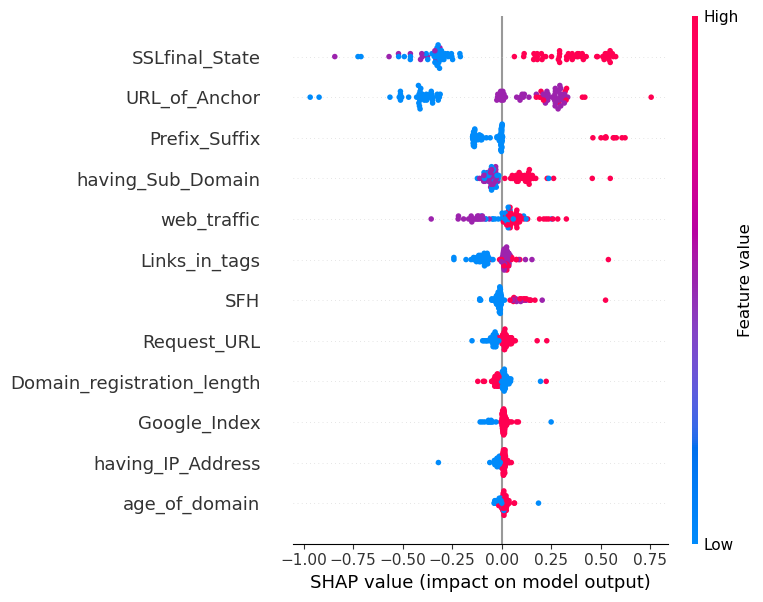

In [77]:
# A look at the forces applied by features to influence model output based
shap.summary_plot(shap_values, X_test_sample, feature_names= X_test.columns)

Explaining Model Predictions Using LIME

In [78]:
targets = y_test.unique()
y_test_val = np.array(y_test)

In [79]:
explainer = LimeTabularExplainer(
                                training_data=np.array(X_train),
                                feature_names=X_train.columns,
                                class_names=targets,
                                mode='classification')


The real class is -1


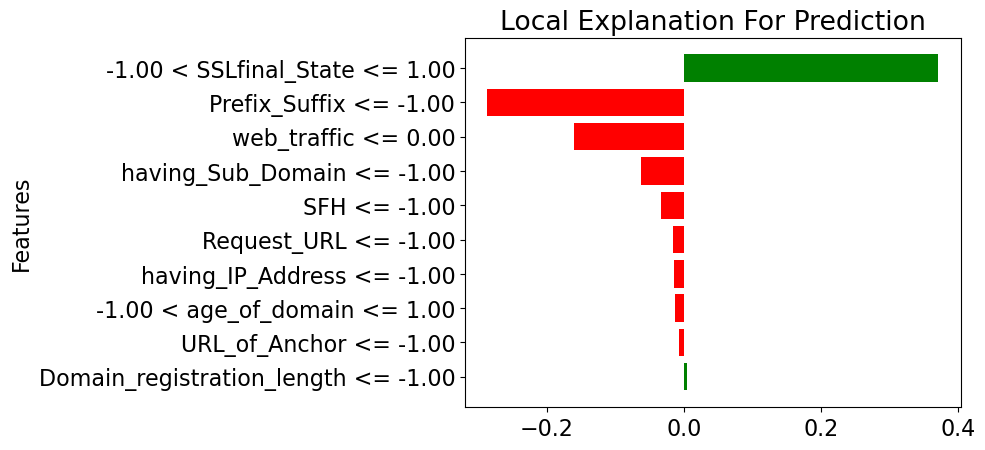



---------------------------------------------------------------------------------------------------------------
The real class is -1


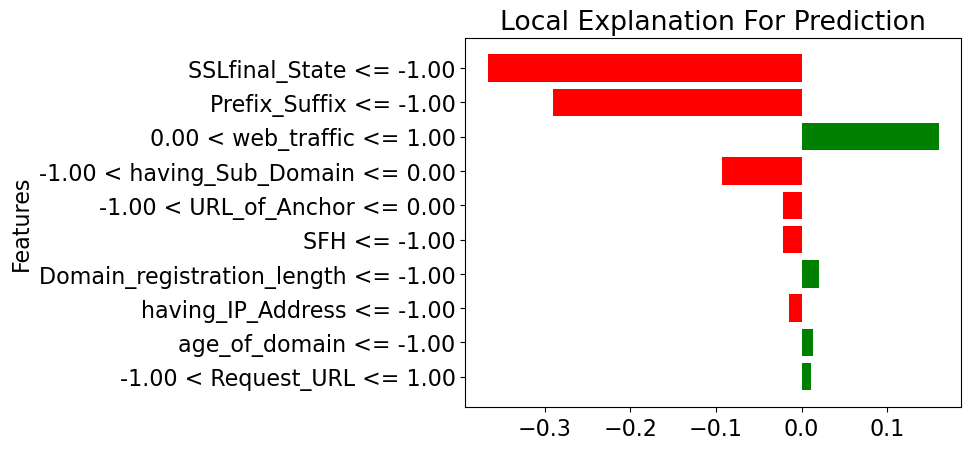



---------------------------------------------------------------------------------------------------------------
The real class is -1


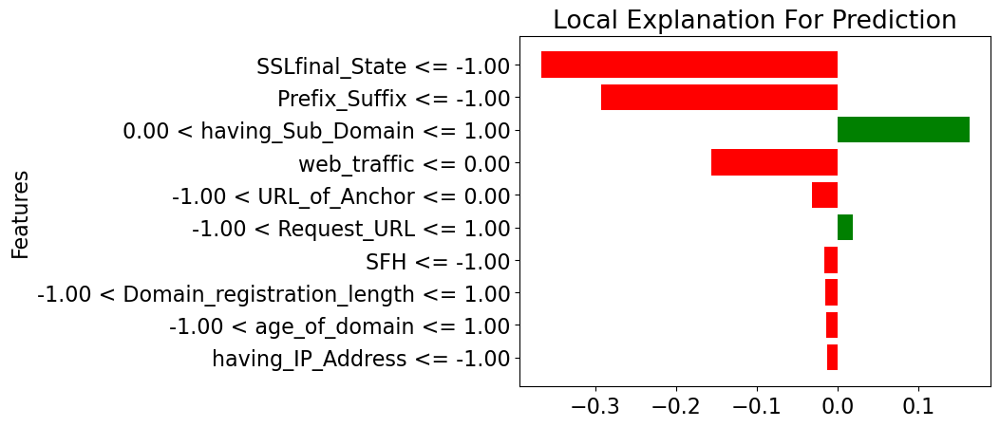



---------------------------------------------------------------------------------------------------------------
The real class is 1


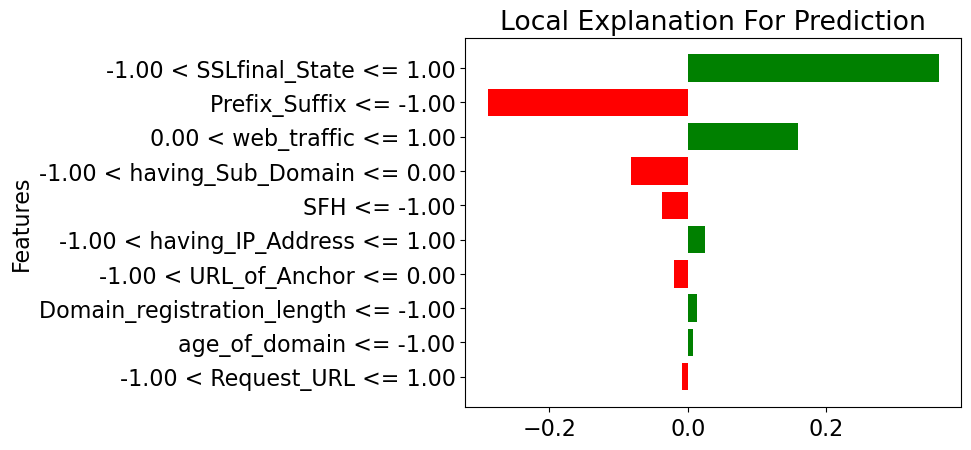



---------------------------------------------------------------------------------------------------------------
The real class is 1


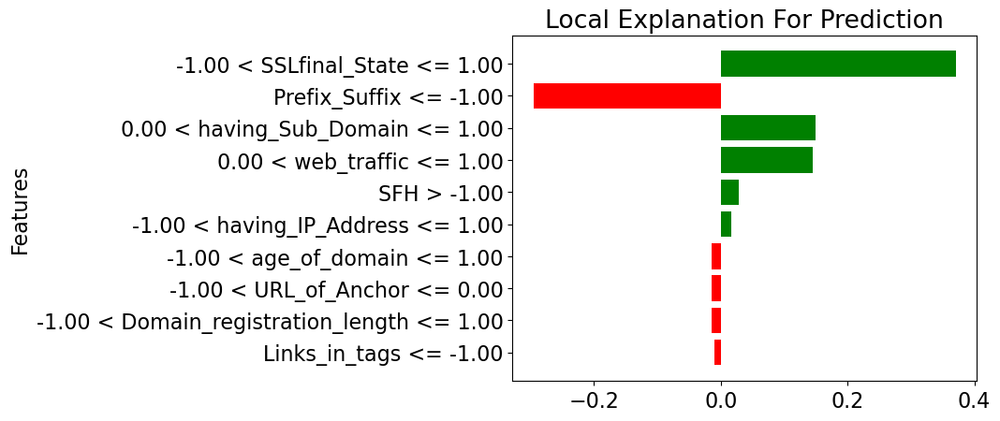



---------------------------------------------------------------------------------------------------------------


In [80]:
#A look at how the Random Forest Model arrives at a particular prediction

# A sample of 5 predictions 
for i in range(5):
    # Choose an observation (e.g., first test data point)
    observation_idx = i

    # Calculate LIME explanations
    explanation = explainer.explain_instance(X_test.iloc[observation_idx], clf_rdf.predict_proba)
    
    #Print the actual class
    print(f"The real class is {y_test_val[i]}")
    
    # Show the predicted class
    
    explanation.show_in_notebook()
    fig = explanation.as_pyplot_figure()
    plt.title('Local Explanation For Prediction')
    plt.ylabel('Features')
    plt.show()
    print('\n')
    print("---------------------------------------------------------------------------------------------------------------")

# THE END!
